In [1]:
# %cd drive/My\ Drive/Colab\ Notebooks

In [2]:
# train_networks: Training CNNs to be used by the main program

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
import os
import imutils
from processing import *

import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from skimage.segmentation import watershed
from skimage.morphology import disk
from skimage.feature import peak_local_max
from skimage.filters import meijering

from scipy import ndimage as ndi


def plot_two_images(imgL, imgR, titleL, titleR):
    f = plt.figure()
    f.add_subplot(1,2, 1)
    plt.imshow(imgL, cmap='gray')
    plt.imshow(imgL)
    plt.title(titleL)
    f.add_subplot(1,2, 2)
    plt.imshow(imgR)
    plt.title(titleR)
    plt.show(block=True)
    
# '''
def load_data(dataset):
    data = []
    paths = [os.path.join(dataset, '01'), os.path.join(dataset, '02')]
    for path in paths:
        mask_path = path + '_ST'
        mask_path = os.path.join(mask_path, 'SEG')
        for f in os.listdir(mask_path):
            if not f.endswith(".tif"):
                continue
            image = cv2.imread(os.path.join(path, f.replace('man_seg', 't')), cv2.IMREAD_GRAYSCALE)
            image = equalize_clahe(image).astype(np.float32)
            mask = cv2.imread(os.path.join(mask_path, f), cv2.IMREAD_UNCHANGED)
            print("   Loaded " + os.path.join(mask_path, f) + ", " + os.path.join(path, f.replace('mask', '')))
            
            # Generate the Cell Mask and Markers from the Mask
            cell_mask = (mask > 0).astype(np.uint8)
            markers = (get_markers(mask) > 0).astype(np.uint8)
            weight_map = get_weight_map(markers)
            
            # Pack the data for the DataLoader
            target = (cell_mask, markers, weight_map)
            data.append((np.array([image]), target))
            
    return DataLoader(data, batch_size=3, shuffle=True)
# '''
'''
def load_data(dataset):
    data = []
    path = os.path.join(dataset, "originals")
    clahe_path = path.replace("originals", "clahes")
    mask_path = path.replace("originals", "masks")
    markers_path = path.replace("originals", "markers")
    wm_path = path.replace("originals", "weight_maps")
    
    for f in os.listdir(path):
        if not f.endswith(".npy"):
            continue
#         image = cv2.imread(os.path.join(path, f), cv2.IMREAD_GRAYSCALE)
#         clahe = cv2.imread(os.path.join(clahe_path, f), cv2.IMREAD_GRAYSCALE).astype(np.float32)
#         cell_mask = cv2.imread(os.path.join(mask_path, f), cv2.IMREAD_UNCHANGED)
#         markers = cv2.imread(os.path.join(markers_path, f), cv2.IMREAD_UNCHANGED)
#         weight_map = cv2.imread(os.path.join(wm_path, f), cv2.IMREAD_UNCHANGED)
        
        image = np.load(os.path.join(path, f))
        clahe = np.load(os.path.join(clahe_path, f))
        cell_mask = np.load(os.path.join(mask_path, f))
        markers = np.load(os.path.join(markers_path, f))
        weight_map = np.load(os.path.join(wm_path, f))
        print("   Loaded " + os.path.join(mask_path, f) + ", " + os.path.join(path, f.replace('mask', '')))
        
        # Generate the Cell Mask and Markers from the Mask
#         cell_mask = (mask > 0).astype(np.uint8)
#         markers = (preprocessing.get_markers(mask) > 0).astype(np.uint8)
#         weight_map = preprocessing.get_weight_map(markers)

#         weight_map = []
        # Pack the data for the DataLoader
        target = (cell_mask, markers, weight_map)
        data.append((np.array([clahe]), target))
            
    return DataLoader(data, batch_size=5, shuffle=True)
'''

'\ndef load_data(dataset):\n    data = []\n    path = os.path.join(dataset, "originals")\n    clahe_path = path.replace("originals", "clahes")\n    mask_path = path.replace("originals", "masks")\n    markers_path = path.replace("originals", "markers")\n    wm_path = path.replace("originals", "weight_maps")\n    \n    for f in os.listdir(path):\n        if not f.endswith(".npy"):\n            continue\n#         image = cv2.imread(os.path.join(path, f), cv2.IMREAD_GRAYSCALE)\n#         clahe = cv2.imread(os.path.join(clahe_path, f), cv2.IMREAD_GRAYSCALE).astype(np.float32)\n#         cell_mask = cv2.imread(os.path.join(mask_path, f), cv2.IMREAD_UNCHANGED)\n#         markers = cv2.imread(os.path.join(markers_path, f), cv2.IMREAD_UNCHANGED)\n#         weight_map = cv2.imread(os.path.join(wm_path, f), cv2.IMREAD_UNCHANGED)\n        \n        image = np.load(os.path.join(path, f))\n        clahe = np.load(os.path.join(clahe_path, f))\n        cell_mask = np.load(os.path.join(mask_path, f))\

In [3]:
# Class for creating the CNN
class Network(nn.Module):
    def __init__(self):
        super(Network, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        self.conv5 = nn.Conv2d(64, 128, 3, padding=1)
        self.conv6 = nn.Conv2d(128, 128, 3, padding=1)
        self.conv7 = nn.Conv2d(128, 256, 3, padding=1)
        self.conv8 = nn.Conv2d(256, 256, 3, padding=1)
        self.conv9 = nn.Conv2d(256, 512, 3, padding=1)
        self.conv10 = nn.Conv2d(512, 512, 3, padding=1)
        self.conv11 = nn.Conv2d(768, 256, 3, padding=1)
        self.conv12 = nn.Conv2d(256, 256, 3, padding=1)
        self.conv13 = nn.Conv2d(384, 128, 3, padding=1)
        self.conv14 = nn.Conv2d(128, 128, 3, padding=1)
        self.conv15 = nn.Conv2d(192, 64, 3, padding=1)
        self.conv16 = nn.Conv2d(64, 64, 3, padding=1)
        self.conv17 = nn.Conv2d(96, 32, 3, padding=1)
        self.conv18 = nn.Conv2d(32, 32, 3, padding=1)
        self.conv_out = nn.Conv2d(32, 2, 1)
        
    def forward(self, x):
        """
        Forward pass through the network
        """
        x = F.relu(self.conv1(x))
        contraction_32 = F.relu(self.conv2(x))
        
        x = F.max_pool2d(contraction_32, kernel_size=2)
        x = F.relu(self.conv3(x))
        contraction_64 = F.relu(self.conv4(x))
        
        x = F.max_pool2d(contraction_64, kernel_size=2)
        x = F.relu(self.conv5(x))
        contraction_128 = F.relu(self.conv6(x))
        
        x = F.max_pool2d(contraction_128, kernel_size=2)
        x = F.relu(self.conv7(x))
        contraction_256 = F.relu(self.conv8(x))
        
        x = F.max_pool2d(contraction_256, kernel_size=2)
        x = F.relu(self.conv9(x))
        x = F.relu(self.conv10(x))
        
        x = F.interpolate(x, scale_factor=2, mode='bilinear')
        x = torch.cat((contraction_256, x), dim=1)
        x = F.relu(self.conv11(x))
        x = F.relu(self.conv12(x))
        
        x = F.interpolate(x, scale_factor=2, mode='bilinear')
        x = torch.cat((contraction_128, x), dim=1)
        x = F.relu(self.conv13(x))
        x = F.relu(self.conv14(x))
        
        x = F.interpolate(x, scale_factor=2, mode='bilinear')
        x = torch.cat((contraction_64, x), dim=1)
        x = F.relu(self.conv15(x))
        x = F.relu(self.conv16(x))
        
        x = F.interpolate(x, scale_factor=2, mode='bilinear')
        x = torch.cat((contraction_32, x), dim=1)
        x = F.relu(self.conv17(x))
        x = F.relu(self.conv18(x))
        
        x = self.conv_out(x)
        output = F.log_softmax(x, dim=1)
        return output


# def weighted_cross_entropy_loss(inputs, targets, weights):

# #     Weighted Cross-Entropy Loss takes in a weight map
# #     and computes loss

#     device = torch.device("cpu")
#     inputs = inputs.to(device)
#     targets = targets.to(device)
#     weights = weights.to(device)
#     loss = torch.zeros(inputs.shape[0])

#     # Calculate loss for each sample in the batch
#     for sample in range(inputs.shape[0]):
#         print("Sample", sample+1)
#         sample_loss, total_weight = 0.0, 0.0
#         for row in range(inputs.shape[2]):
#             for col in range(inputs.shape[3]):
#                 # Get pixel q
#                 q = (row, col)
#                 w = weights[sample][q].item()
#                 total_weight += w
#                 if targets[sample][0][q] == 0:
#                     # Get predicted probability for q = 0
#                     p = inputs[sample][0][q]
#                 else:
#                     # Get predicted probability for q = 1
#                     p = inputs[sample][1][q]
#                 sample_loss -= w * torch.log(p).item()
#         sample_loss = sample_loss / total_weight
#         loss[sample] = sample_loss

#     return torch.mean(loss)

# '''
def weighted_cross_entropy_loss(inputs, targets, weights):

#     Weighted Cross-Entropy Loss takes in a weight map
#     and computes loss

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print('.', end='')
    
    inputs = inputs.to(device)
    targets = targets.to(device)
    weights = weights.to(device)
    loss = torch.zeros(inputs.shape[0])

    # Calculate loss for each sample in the batch
    for sample in range(inputs.shape[0]):
        # print("Sample", sample+1)
        sample_loss, total_weight = 0.0, 0.0
        
        # P(y(q))q
        # log_p = torch.where( (targets[sample] < 0), torch.zeros(targets.shape), targets[sample])
        log_p = torch.where( (targets[sample] == 0), inputs[sample][0], inputs[sample][1])
        # print(torch.unique(inputs[sample][0]))
        
        log_pw = log_p * weights[sample]
        
        sum_log_pw = torch.sum(log_pw)
        sum_weights = torch.sum(weights[sample])
        # print(log_p,  sum_log_pw, sum_weights)

        div_sums = sum_log_pw / sum_weights
        
        sample_loss = div_sums * -1
        # print(div_sums, sample_loss)

        loss[sample] = sample_loss

    return torch.mean(loss)
# '''

def main():
    """
    Train 2 networks for predicting markers and the cell mask respectively
    Set trains on data from "Sequence 1 Masks" and "Sequence 2 Masks"
    and save the models
    """
    torch.cuda.set_device(0)
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print("Using device: " + str(device))
    
    # Net M predicts the markers. Net C predicts the cell mask
    net_m, net_c = Network().to(device), Network().to(device)
    
    # criterion = F.nll_loss
    criterion = weighted_cross_entropy_loss
    
    # Optimising using Adam algorithm
    optimiser_m = optim.Adam(net_m.parameters(), lr=0.001)
    optimiser_c = optim.Adam(net_c.parameters(), lr=0.001)
    
    # Iterate over a number of epochs on the data
    for epoch in range(100):
        for i, batch in enumerate(trainLoader):
            x = batch[0].to(device)
            target = batch[1]
            cell_masks, markers = target[0].to(device), target[1].to(device) # Unpack target data
            weight_map = target[2].to(device)

            # Clear gradients from last step
            optimiser_m.zero_grad()
            optimiser_c.zero_grad()

            # Predict the markers from the image
            output_m = net_m(x)
            # loss_m = criterion(output_m, markers.long())
            loss_m = criterion(output_m, markers.float(), weight_map)
            loss_m.backward()
            optimiser_m.step()
            
            # Predict the Cell Mask from the image
            output_c = net_c(x)
            loss_c = criterion(output_c, cell_masks.float(), weight_map)
            # loss_c = criterion(output_c, cell_masks.long())
            loss_c.backward()
            optimiser_c.step()

            if i == 0 or (i + 1) % 10 == 0:
                print(f"Epoch: {epoch+1}, Batch: {i + 1}")
                print(f"Cell Mask Loss: {loss_c.item():.2f}, Markers Loss: {loss_m.item():.2f}")
                
                plt.imshow(x[0][0].cpu(), cmap='gray')
                plt.title("Input")
                plt.show()

                # Get the predicted Cell Mask and Markers for one of the images
                pred_c = torch.argmax(output_c[0], dim=0).cpu()
                pred_m = torch.argmax(output_m[0], dim=0).cpu()
                
                _c_img = cv2.imread(os.path.join("DIC-C2DH-HeLa", "Sequence 3", "t002.tif"), cv2.IMREAD_GRAYSCALE)
                _c = torch.tensor(np.array([[_c_img]])).float().to(device)
                
                out_test_m = net_m(_c)
                loss_test_m = criterion(out_test_m, markers.float(), weight_map)
                
                out_test_c = net_c(_c)
                loss_test_c = criterion(out_test_c, cell_masks.float(), weight_map)
                
                pred_test_c = torch.argmax(out_test_c[0], dim=0).cpu()
                pred_test_m = torch.argmax(out_test_m[0], dim=0).cpu()
                
                ws_labels = get_ws_from_markers(pred_test_m.numpy(), pred_test_c.numpy())
                bound_box = get_bound_box_from_ws(_c_img, ws_labels)
                
                # Compare predicted to true images
                plot_two_images(pred_c, cell_masks[0].cpu(), "Predicted Cell Mask", "True Cell Mask")
                plot_two_images(pred_m, markers[0].cpu(), "Predicted Markers", "True Markers")
                
                print(f"Test Cell Mask Loss: {loss_test_c.item():.2f}, Test Markers Loss: {loss_test_m.item():.2f}")
                plot_two_images(_c_img, pred_test_c, "test_image", "Predicted Cell Mask Test")
                plot_two_images(pred_test_m, ws_labels, "Predicted Markers Test", "Watershed_labels")
                
                plt.imshow(bound_box, cmap='gray')
                plt.title("Cells with bounding box.")

    torch.save(net_m.state_dict(), "./CNN_m.pth")
    torch.save(net_c.state_dict(), "./CNN_c.pth")
    print("Saved models.")

In [4]:
print("Loading Data...")
trainLoader = load_data('DIC-2')
print("Finished.")

Loading Data...
   Loaded DIC-2\01_ST\SEG\man_seg000.tif, DIC-2\01\man_seg000.tif
   Loaded DIC-2\01_ST\SEG\man_seg001.tif, DIC-2\01\man_seg001.tif
   Loaded DIC-2\01_ST\SEG\man_seg002.tif, DIC-2\01\man_seg002.tif
   Loaded DIC-2\01_ST\SEG\man_seg003.tif, DIC-2\01\man_seg003.tif
   Loaded DIC-2\01_ST\SEG\man_seg004.tif, DIC-2\01\man_seg004.tif
   Loaded DIC-2\01_ST\SEG\man_seg005.tif, DIC-2\01\man_seg005.tif
   Loaded DIC-2\01_ST\SEG\man_seg006.tif, DIC-2\01\man_seg006.tif
   Loaded DIC-2\01_ST\SEG\man_seg007.tif, DIC-2\01\man_seg007.tif
   Loaded DIC-2\01_ST\SEG\man_seg008.tif, DIC-2\01\man_seg008.tif
   Loaded DIC-2\01_ST\SEG\man_seg009.tif, DIC-2\01\man_seg009.tif
   Loaded DIC-2\01_ST\SEG\man_seg010.tif, DIC-2\01\man_seg010.tif
   Loaded DIC-2\01_ST\SEG\man_seg011.tif, DIC-2\01\man_seg011.tif
   Loaded DIC-2\01_ST\SEG\man_seg012.tif, DIC-2\01\man_seg012.tif
   Loaded DIC-2\01_ST\SEG\man_seg013.tif, DIC-2\01\man_seg013.tif
   Loaded DIC-2\01_ST\SEG\man_seg014.tif, DIC-2\01\man_seg01

   Loaded DIC-2\02_ST\SEG\man_seg040.tif, DIC-2\02\man_seg040.tif
   Loaded DIC-2\02_ST\SEG\man_seg041.tif, DIC-2\02\man_seg041.tif
   Loaded DIC-2\02_ST\SEG\man_seg042.tif, DIC-2\02\man_seg042.tif
   Loaded DIC-2\02_ST\SEG\man_seg043.tif, DIC-2\02\man_seg043.tif
   Loaded DIC-2\02_ST\SEG\man_seg044.tif, DIC-2\02\man_seg044.tif
   Loaded DIC-2\02_ST\SEG\man_seg045.tif, DIC-2\02\man_seg045.tif
   Loaded DIC-2\02_ST\SEG\man_seg046.tif, DIC-2\02\man_seg046.tif
   Loaded DIC-2\02_ST\SEG\man_seg047.tif, DIC-2\02\man_seg047.tif
   Loaded DIC-2\02_ST\SEG\man_seg048.tif, DIC-2\02\man_seg048.tif
   Loaded DIC-2\02_ST\SEG\man_seg049.tif, DIC-2\02\man_seg049.tif
   Loaded DIC-2\02_ST\SEG\man_seg050.tif, DIC-2\02\man_seg050.tif
   Loaded DIC-2\02_ST\SEG\man_seg051.tif, DIC-2\02\man_seg051.tif
   Loaded DIC-2\02_ST\SEG\man_seg052.tif, DIC-2\02\man_seg052.tif
   Loaded DIC-2\02_ST\SEG\man_seg053.tif, DIC-2\02\man_seg053.tif
   Loaded DIC-2\02_ST\SEG\man_seg054.tif, DIC-2\02\man_seg054.tif
   Loaded 

Using device: cuda:0


E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..Epoch: 1, Batch: 1
Cell Mask Loss: 0.50, Markers Loss: 0.72


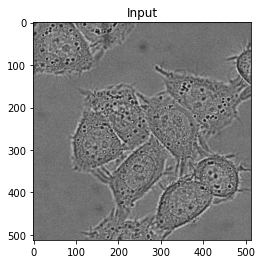

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.40, Test Markers Loss: 2.41


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


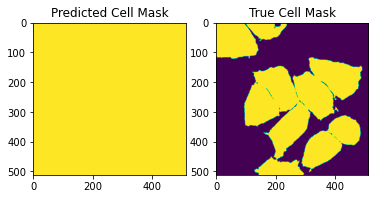

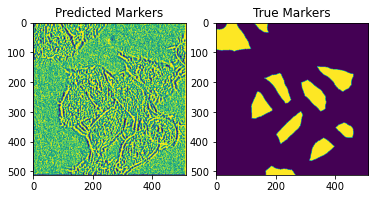

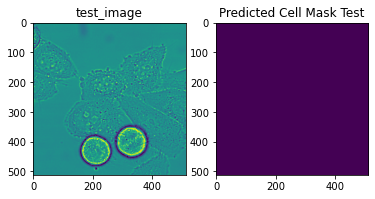

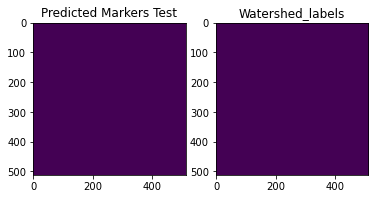

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 1, Batch: 10
Cell Mask Loss: 0.46, Markers Loss: 0.71


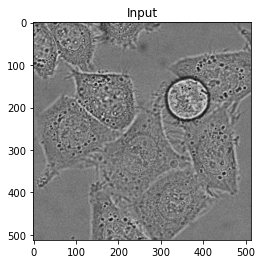

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.43, Test Markers Loss: 0.73


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


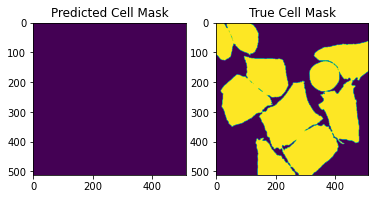

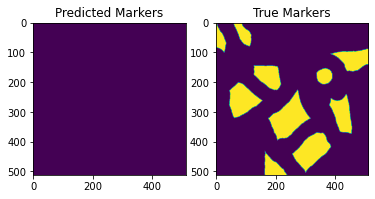

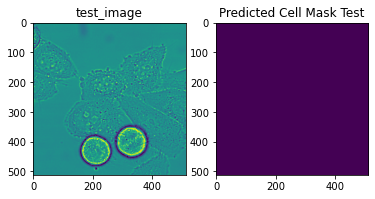

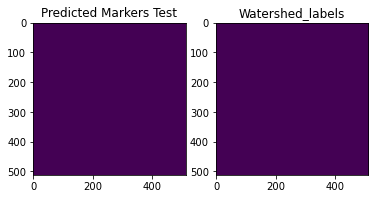

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 1, Batch: 20
Cell Mask Loss: 0.47, Markers Loss: 0.68


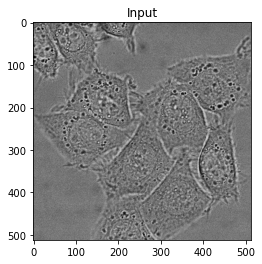

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.42, Test Markers Loss: 0.70


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


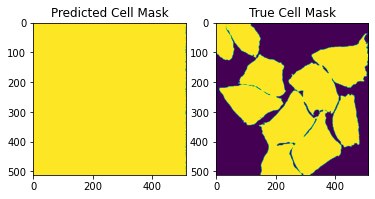

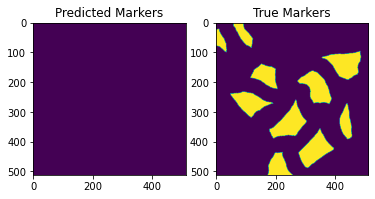

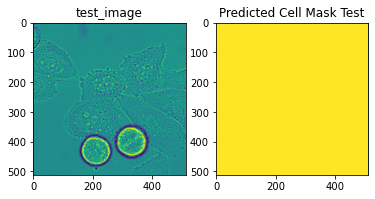

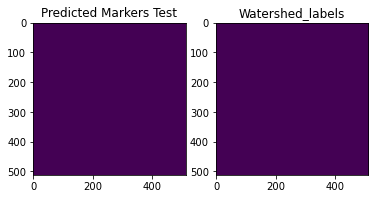

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 1, Batch: 30
Cell Mask Loss: 0.38, Markers Loss: 0.67


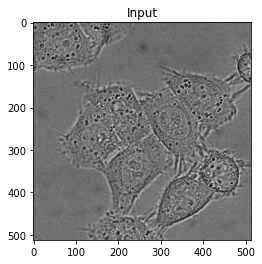

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.52, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


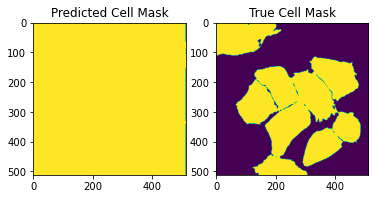

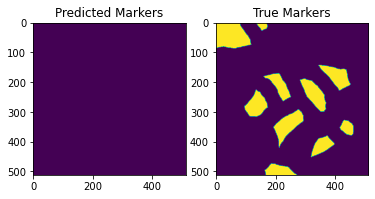

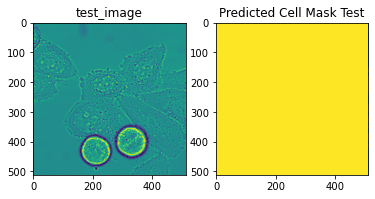

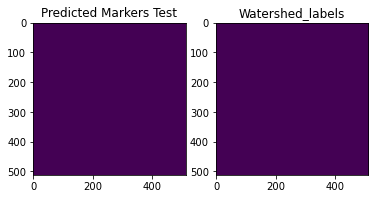

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 1, Batch: 40
Cell Mask Loss: 0.68, Markers Loss: 0.66


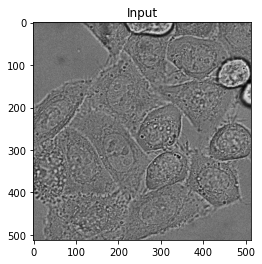

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.42, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


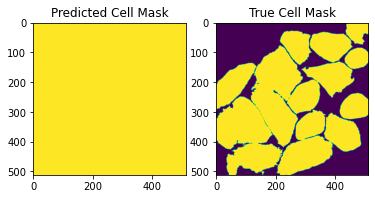

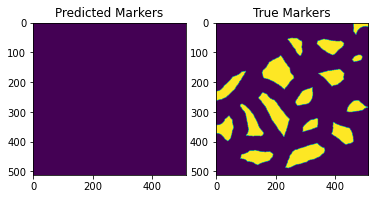

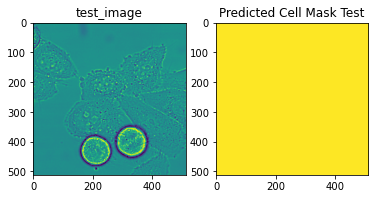

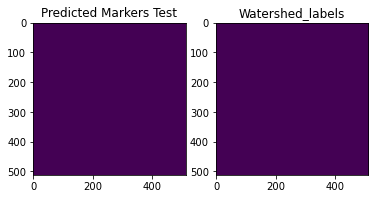

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 1, Batch: 50
Cell Mask Loss: 0.46, Markers Loss: 0.68


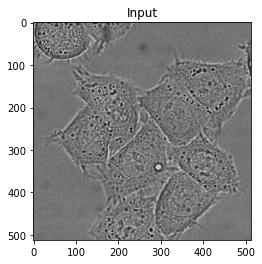

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.48, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


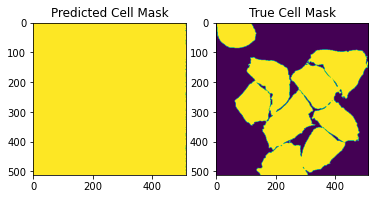

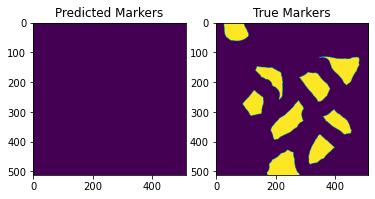

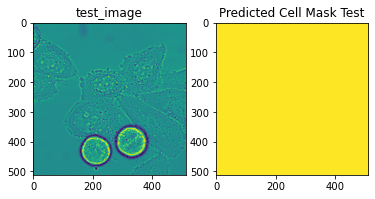

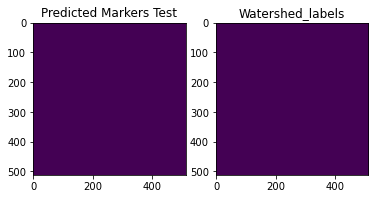

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 2, Batch: 1
Cell Mask Loss: 0.41, Markers Loss: 0.68


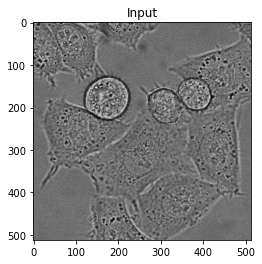

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.40, Test Markers Loss: 0.71


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


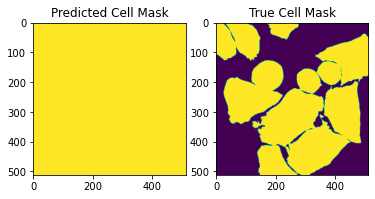

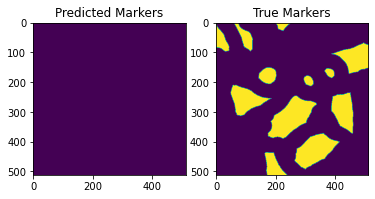

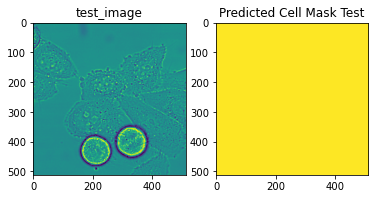

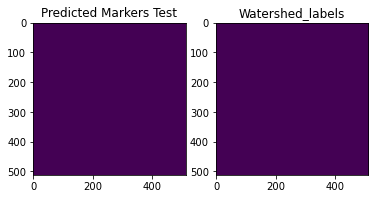

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 2, Batch: 10
Cell Mask Loss: 0.50, Markers Loss: 0.67


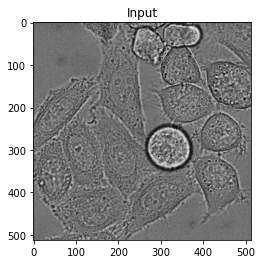

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.55, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


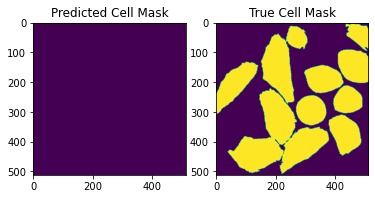

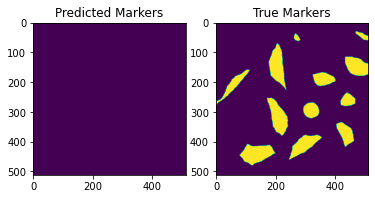

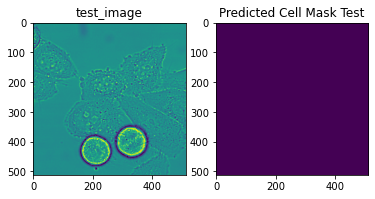

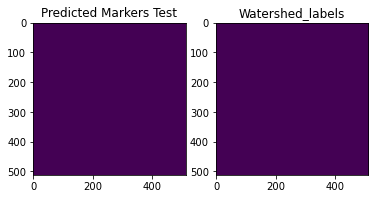

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 2, Batch: 20
Cell Mask Loss: 0.50, Markers Loss: 0.66


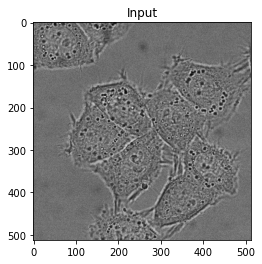

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.53, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


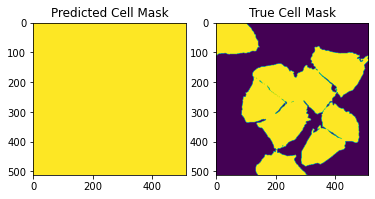

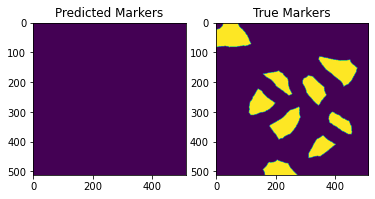

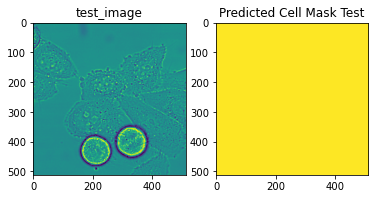

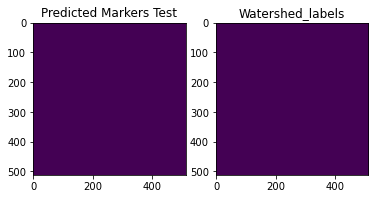

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 2, Batch: 30
Cell Mask Loss: 0.45, Markers Loss: 0.68


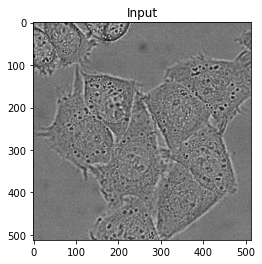

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.44, Test Markers Loss: 0.69


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


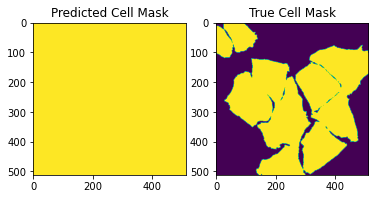

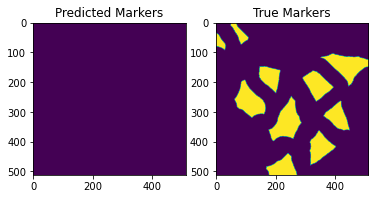

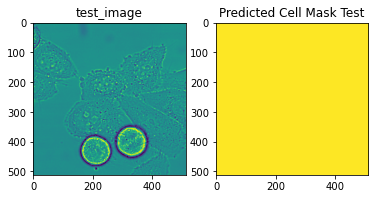

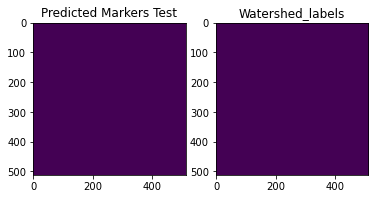

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 2, Batch: 40
Cell Mask Loss: 0.49, Markers Loss: 0.67


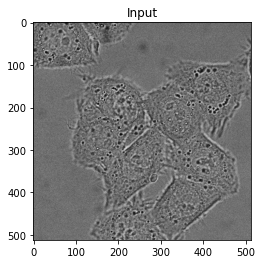

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.50, Test Markers Loss: 0.69


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


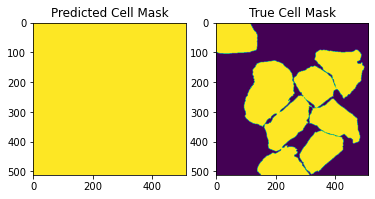

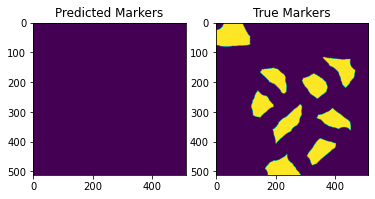

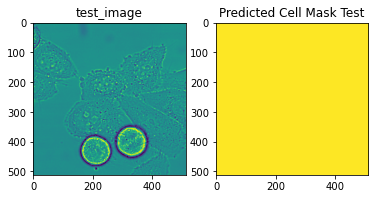

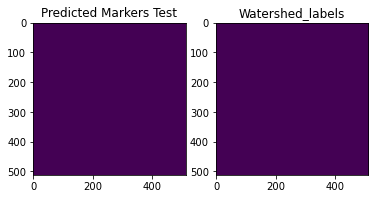

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 2, Batch: 50
Cell Mask Loss: 0.45, Markers Loss: 0.67


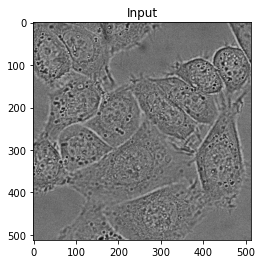

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.39, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


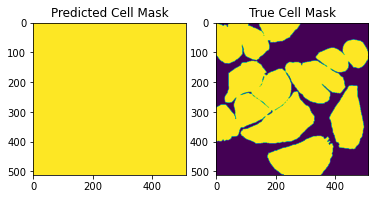

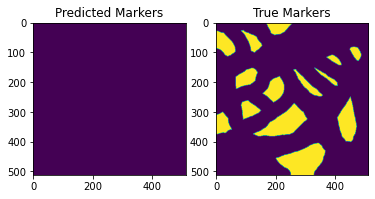

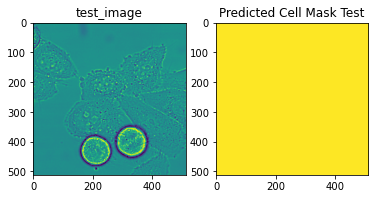

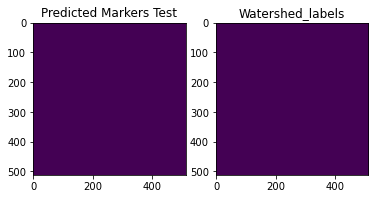

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 3, Batch: 1
Cell Mask Loss: 0.40, Markers Loss: 0.68


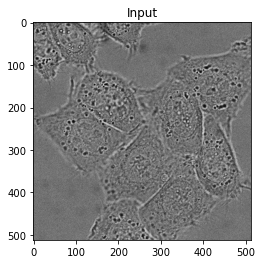

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.39, Test Markers Loss: 0.73


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


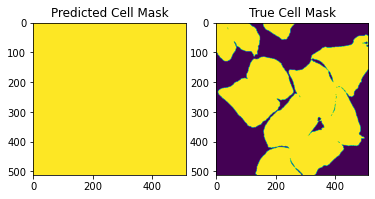

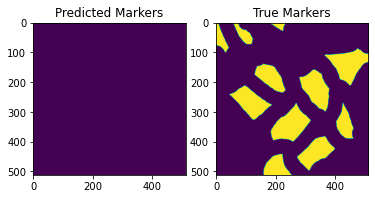

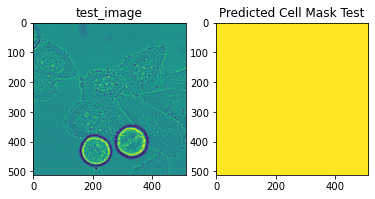

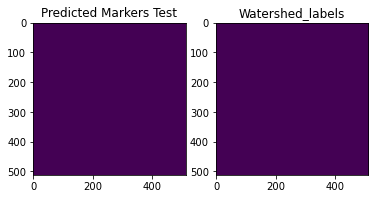

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 3, Batch: 10
Cell Mask Loss: 0.43, Markers Loss: 0.66


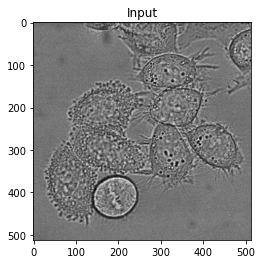

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.60, Test Markers Loss: 0.64


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


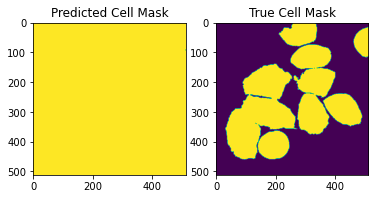

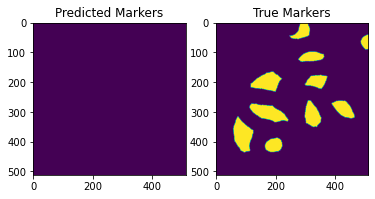

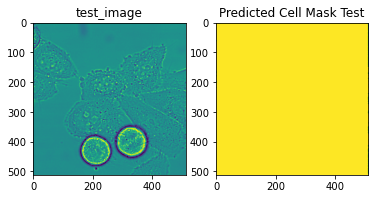

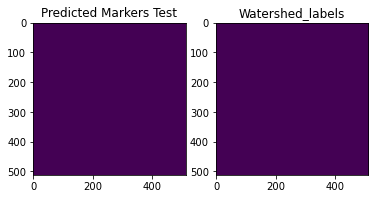

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 3, Batch: 20
Cell Mask Loss: 0.43, Markers Loss: 0.67


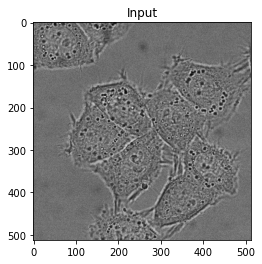

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.52, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


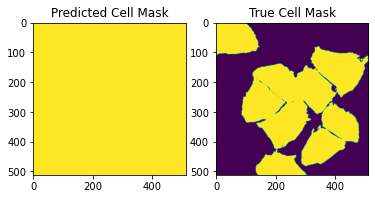

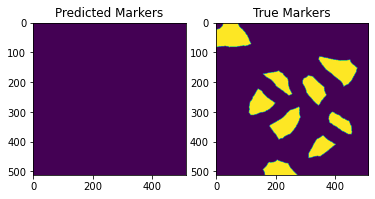

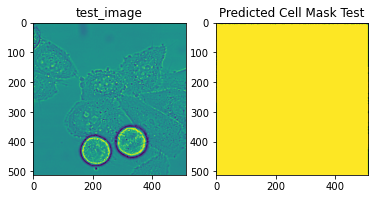

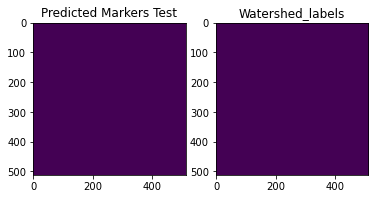

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 3, Batch: 30
Cell Mask Loss: 0.39, Markers Loss: 0.67


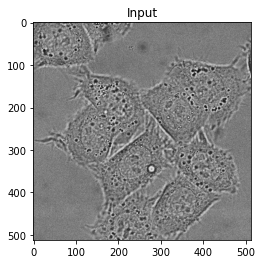

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.50, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


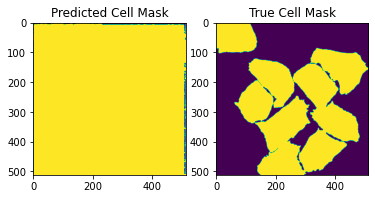

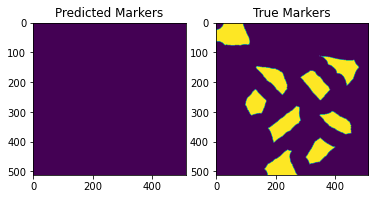

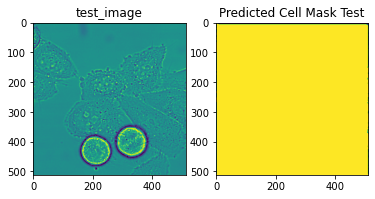

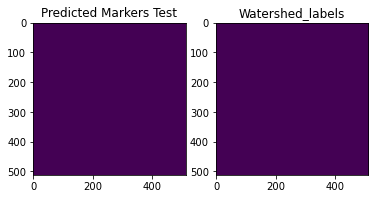

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 3, Batch: 40
Cell Mask Loss: 0.38, Markers Loss: 0.68


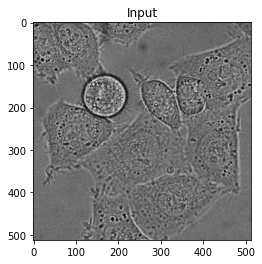

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.89, Test Markers Loss: 0.70


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


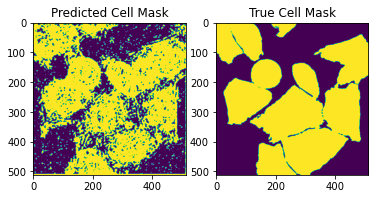

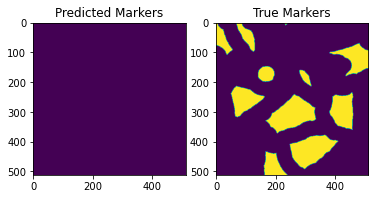

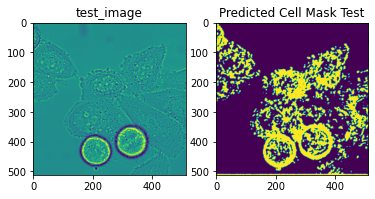

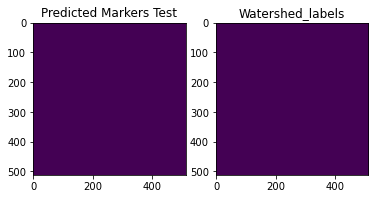

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 3, Batch: 50
Cell Mask Loss: 0.37, Markers Loss: 0.67


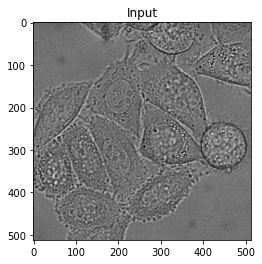

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.13, Test Markers Loss: 0.66


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


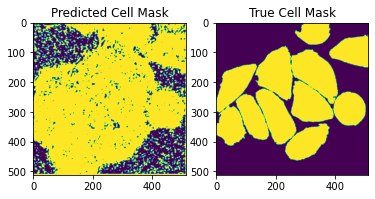

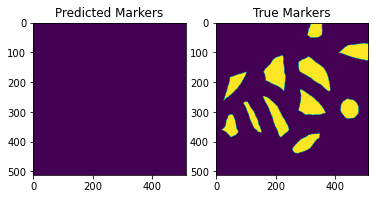

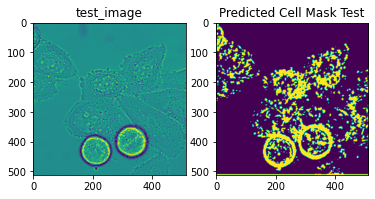

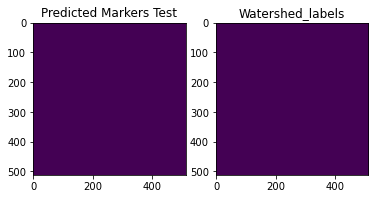

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 4, Batch: 1
Cell Mask Loss: 0.35, Markers Loss: 0.67


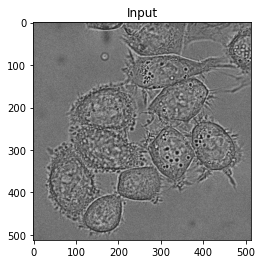

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.85, Test Markers Loss: 0.63


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


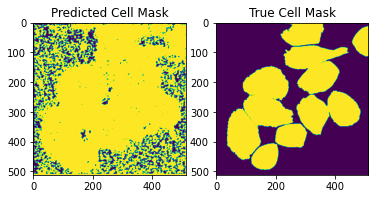

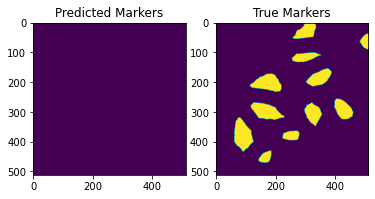

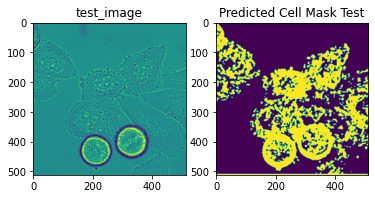

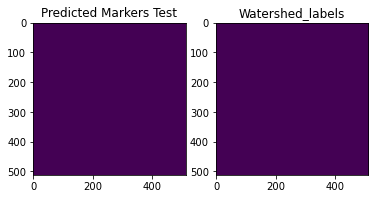

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 4, Batch: 10
Cell Mask Loss: 0.42, Markers Loss: 0.67


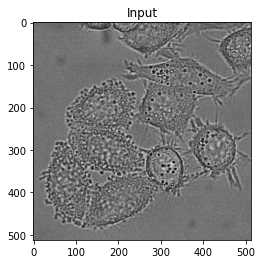

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.97, Test Markers Loss: 0.64


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


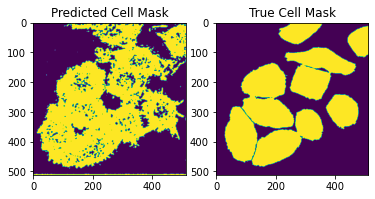

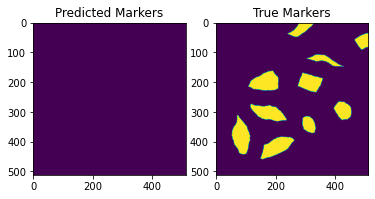

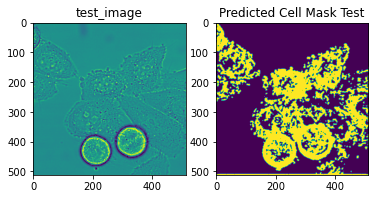

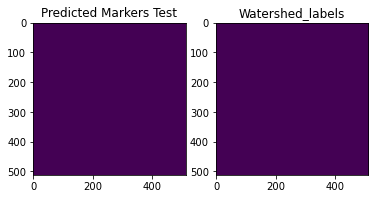

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 4, Batch: 20
Cell Mask Loss: 0.35, Markers Loss: 0.66


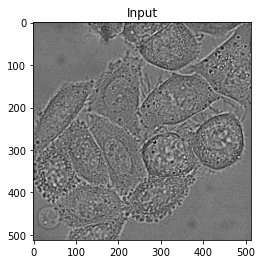

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.22, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


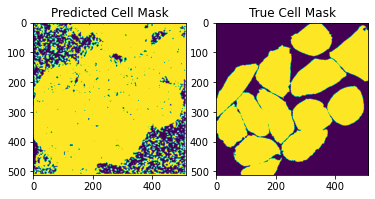

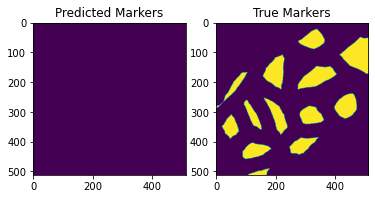

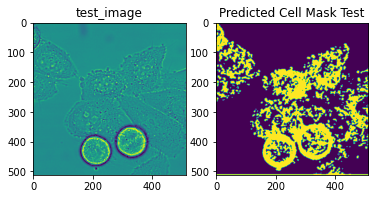

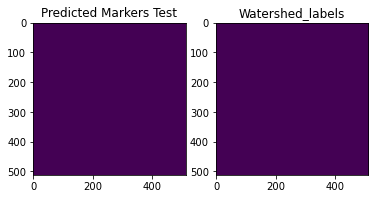

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 4, Batch: 30
Cell Mask Loss: 0.32, Markers Loss: 0.66


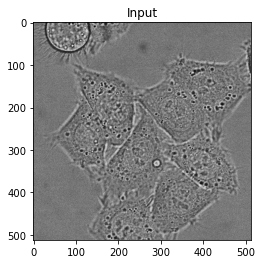

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.62, Test Markers Loss: 0.70


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


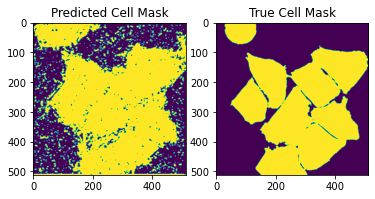

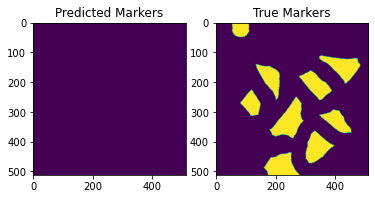

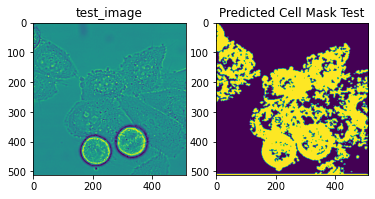

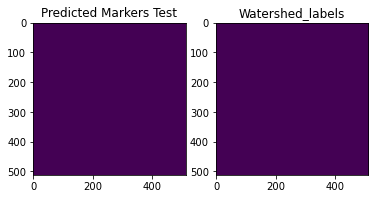

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 4, Batch: 40
Cell Mask Loss: 0.28, Markers Loss: 0.68


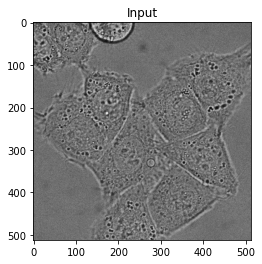

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.15, Test Markers Loss: 0.69


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


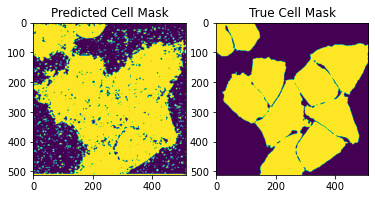

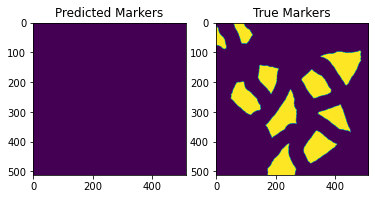

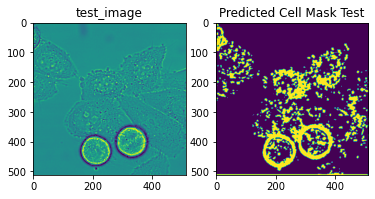

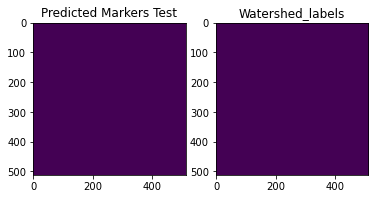

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 4, Batch: 50
Cell Mask Loss: 0.29, Markers Loss: 0.69


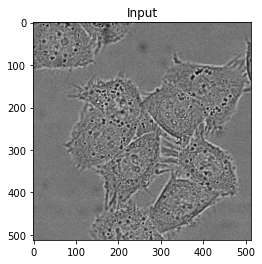

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.05, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


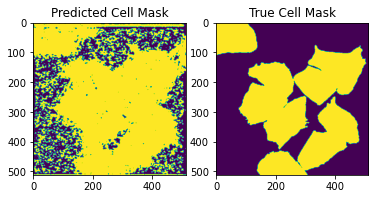

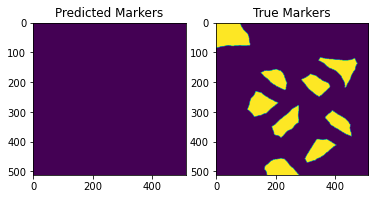

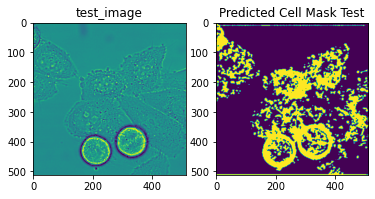

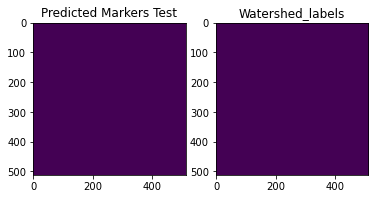

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 5, Batch: 1
Cell Mask Loss: 0.30, Markers Loss: 0.68


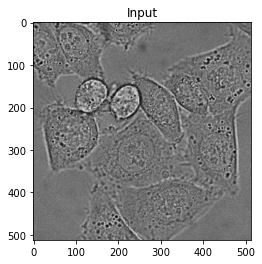

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.40, Test Markers Loss: 0.71


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


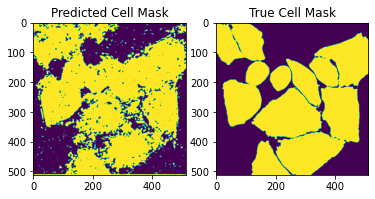

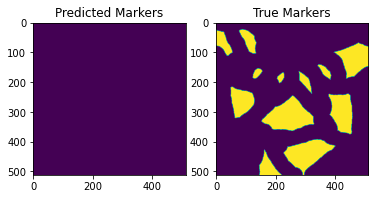

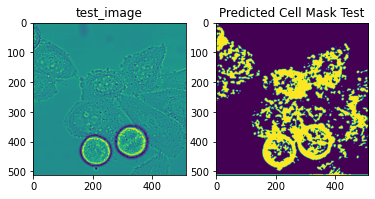

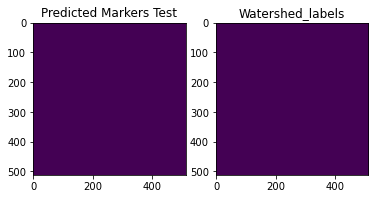

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 5, Batch: 10
Cell Mask Loss: 0.32, Markers Loss: 0.66


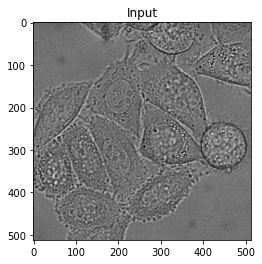

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 2.22, Test Markers Loss: 0.66


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


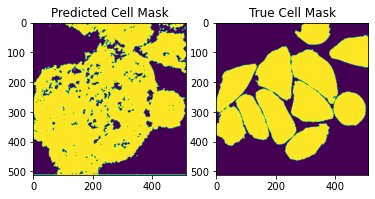

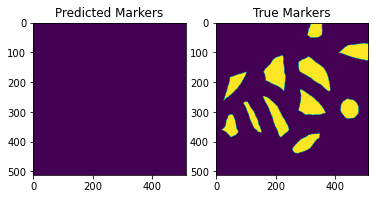

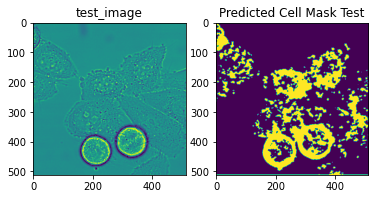

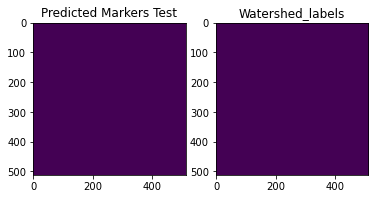

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 5, Batch: 20
Cell Mask Loss: 0.30, Markers Loss: 0.68


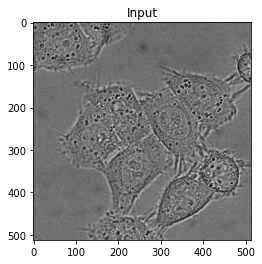

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.62, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


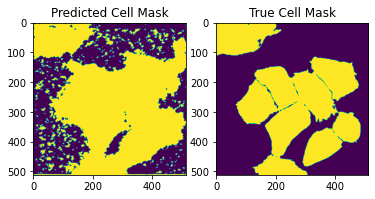

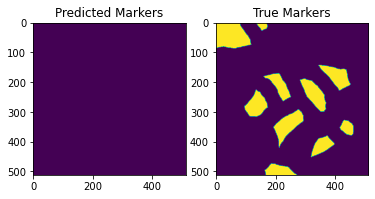

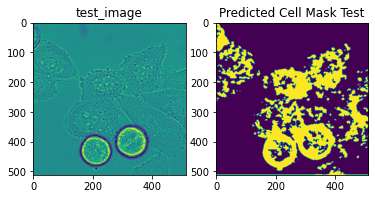

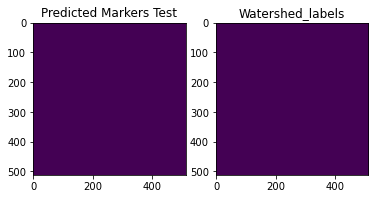

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 5, Batch: 30
Cell Mask Loss: 0.23, Markers Loss: 0.69


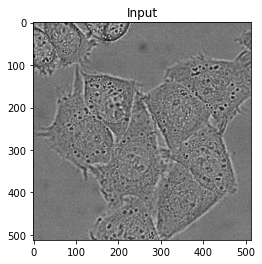

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.86, Test Markers Loss: 0.70


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


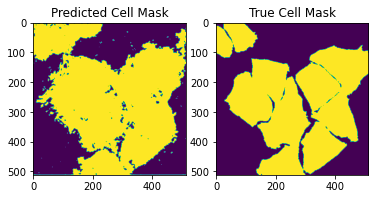

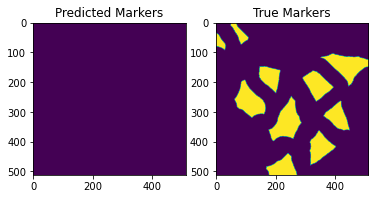

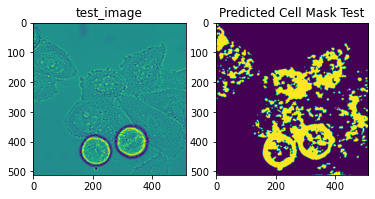

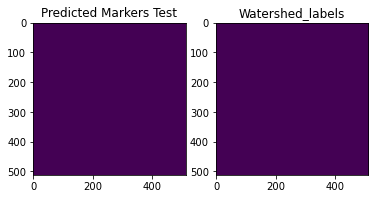

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 5, Batch: 40
Cell Mask Loss: 0.25, Markers Loss: 0.67


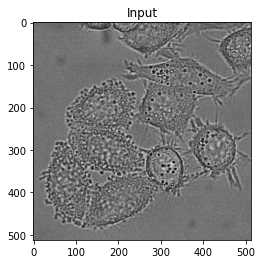

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 3.41, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


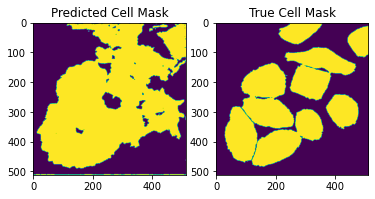

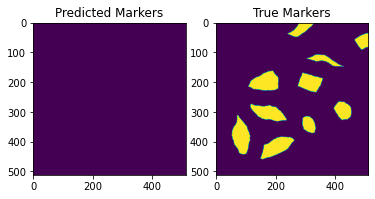

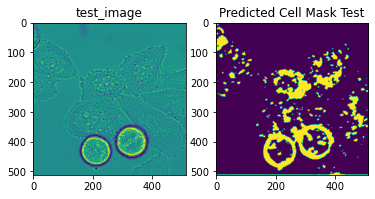

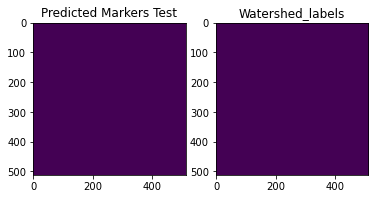

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 5, Batch: 50
Cell Mask Loss: 0.27, Markers Loss: 0.68


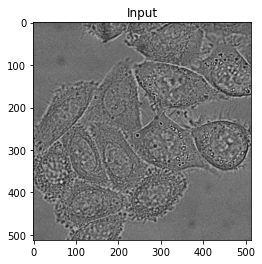

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.16, Test Markers Loss: 0.66


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


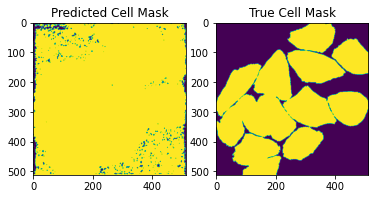

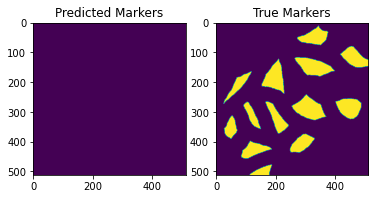

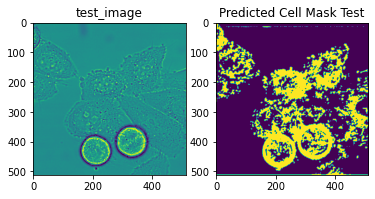

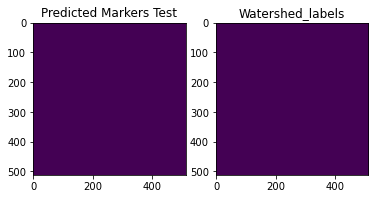

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 6, Batch: 1
Cell Mask Loss: 0.30, Markers Loss: 0.67


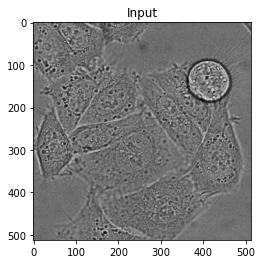

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.27, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


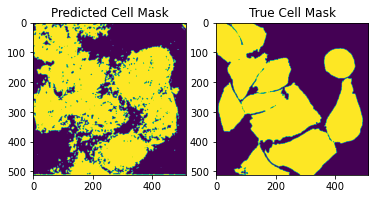

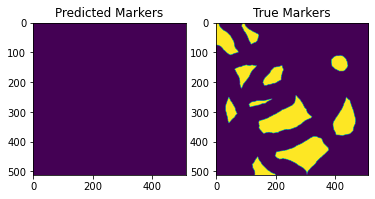

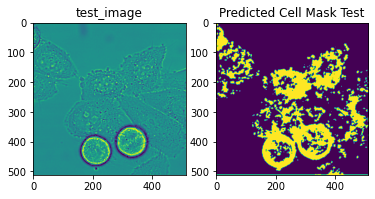

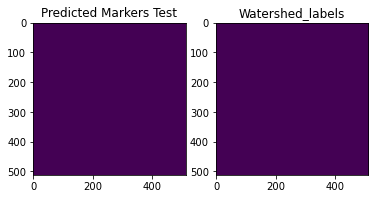

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 6, Batch: 10
Cell Mask Loss: 0.35, Markers Loss: 0.68


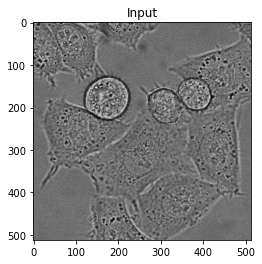

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.67, Test Markers Loss: 0.70


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


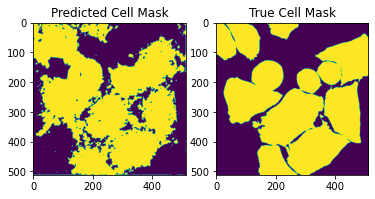

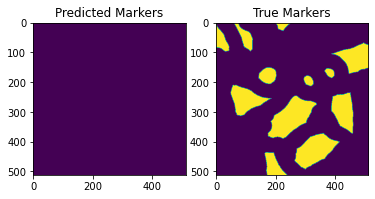

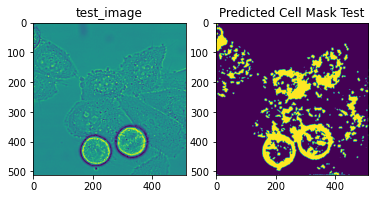

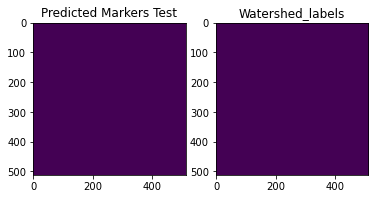

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 6, Batch: 20
Cell Mask Loss: 0.31, Markers Loss: 0.66


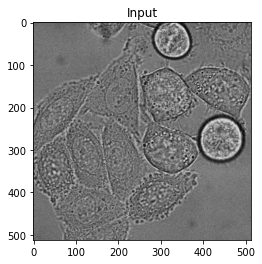

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 2.46, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


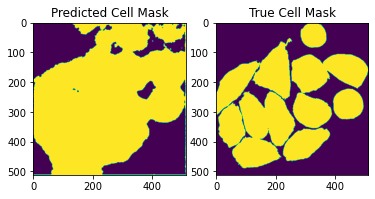

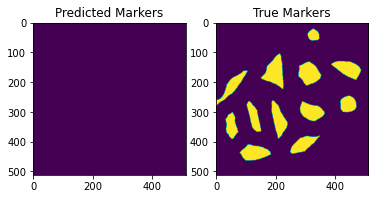

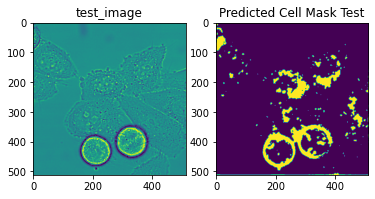

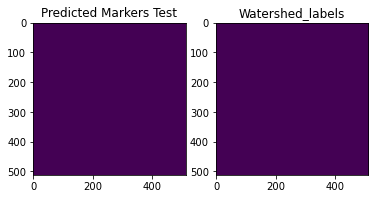

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 6, Batch: 30
Cell Mask Loss: 0.28, Markers Loss: 0.65


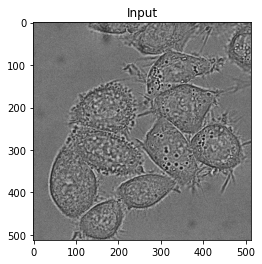

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 11.43, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


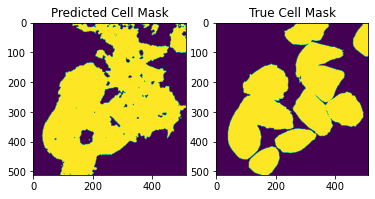

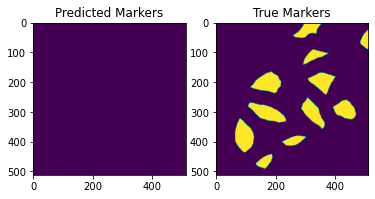

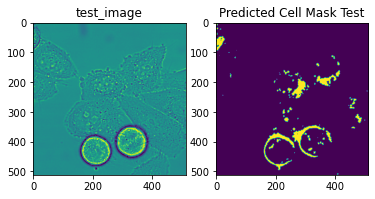

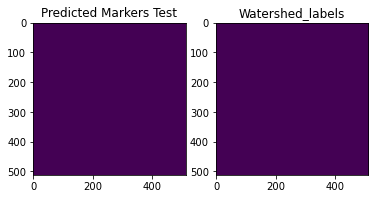

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 6, Batch: 40
Cell Mask Loss: 0.49, Markers Loss: 0.66


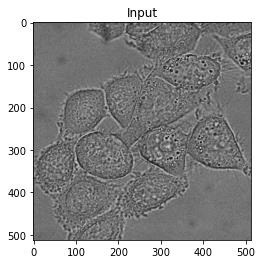

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.58, Test Markers Loss: 0.64


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


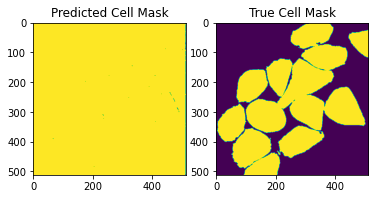

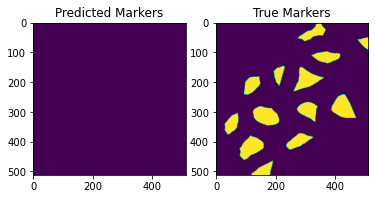

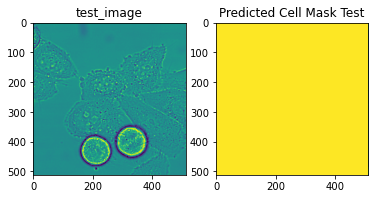

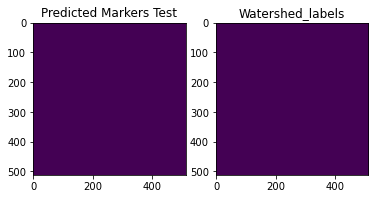

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 6, Batch: 50
Cell Mask Loss: 0.45, Markers Loss: 0.67


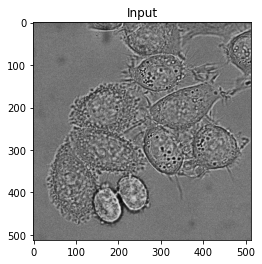

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.58, Test Markers Loss: 0.64


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


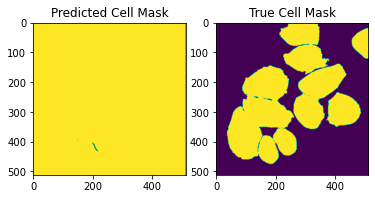

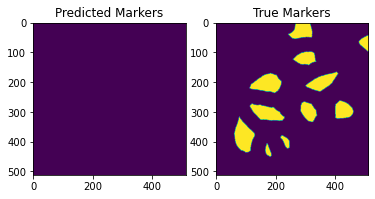

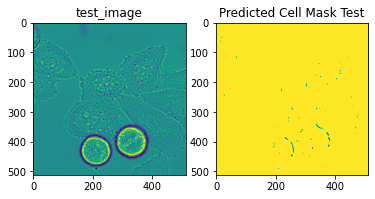

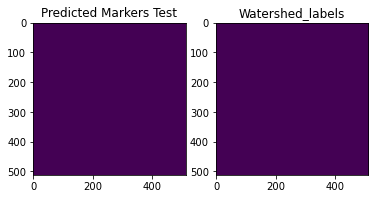

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 7, Batch: 1
Cell Mask Loss: 0.46, Markers Loss: 0.68


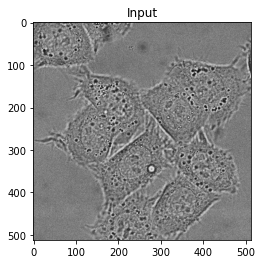

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.48, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


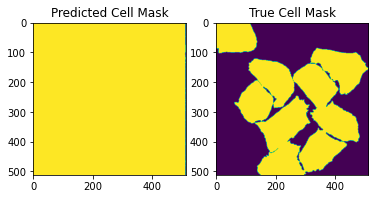

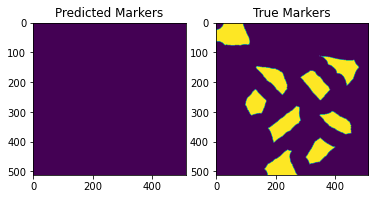

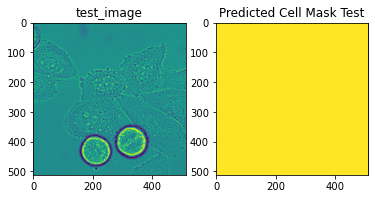

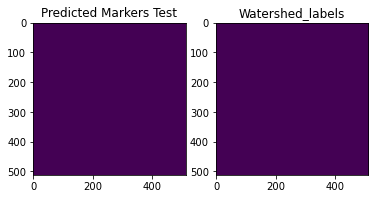

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 7, Batch: 10
Cell Mask Loss: 0.53, Markers Loss: 0.66


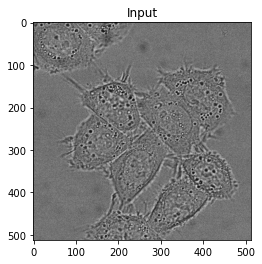

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.60, Test Markers Loss: 0.64


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


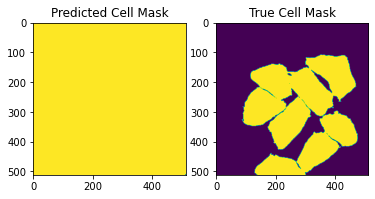

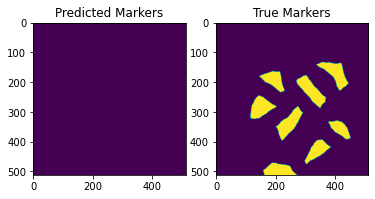

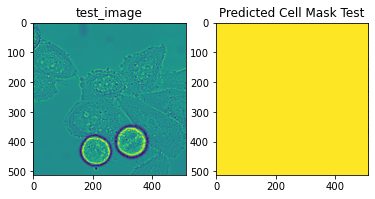

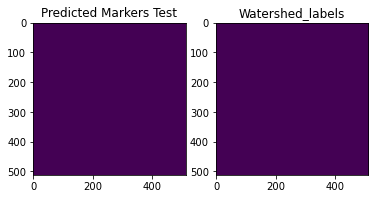

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 7, Batch: 20
Cell Mask Loss: 0.46, Markers Loss: 0.67


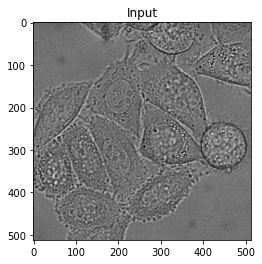

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.47, Test Markers Loss: 0.66


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


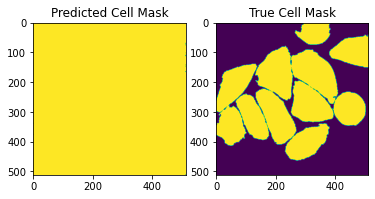

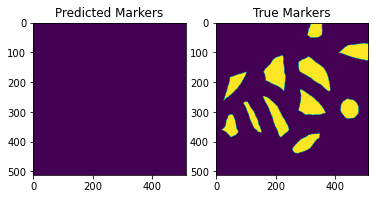

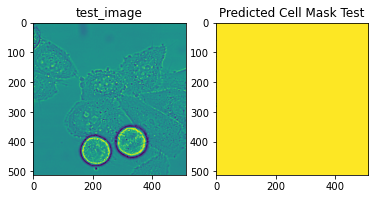

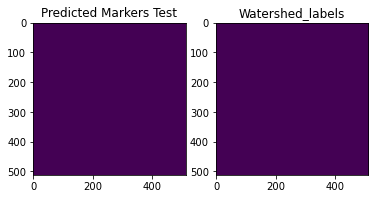

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 7, Batch: 30
Cell Mask Loss: 0.42, Markers Loss: 0.66


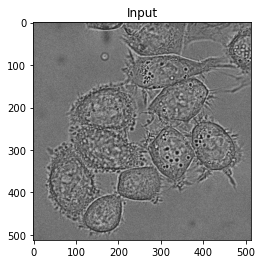

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.65, Test Markers Loss: 0.64


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


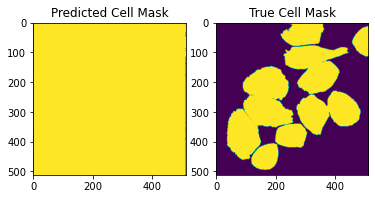

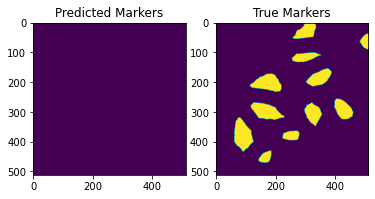

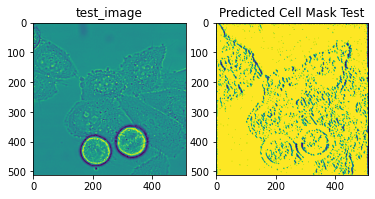

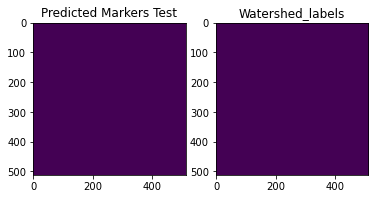

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 7, Batch: 40
Cell Mask Loss: 0.34, Markers Loss: 0.67


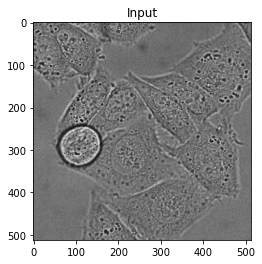

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.76, Test Markers Loss: 0.69


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


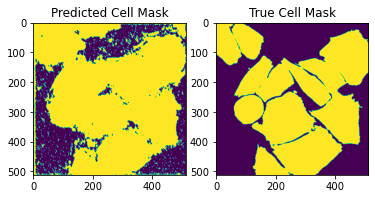

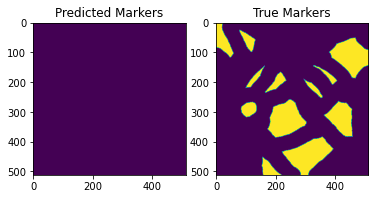

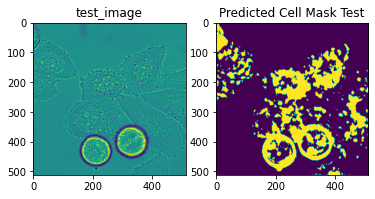

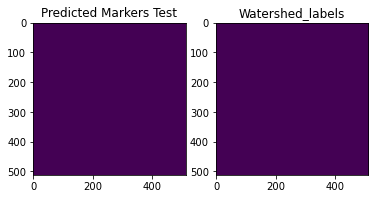

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 7, Batch: 50
Cell Mask Loss: 0.45, Markers Loss: 0.64


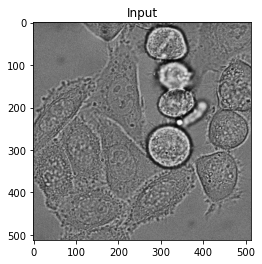

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.56, Test Markers Loss: 0.62


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


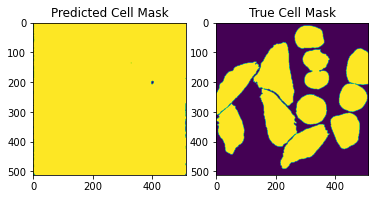

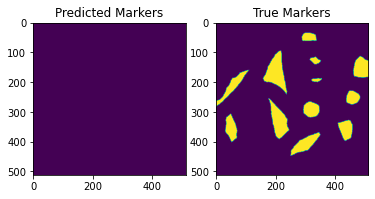

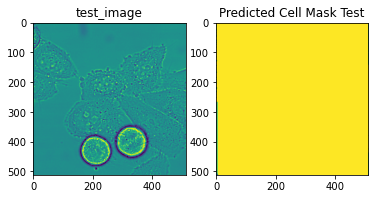

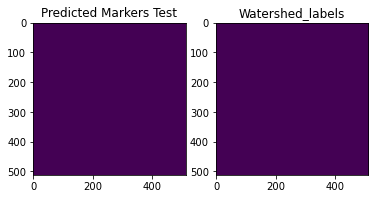

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 8, Batch: 1
Cell Mask Loss: 0.56, Markers Loss: 0.68


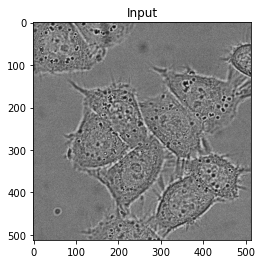

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.60, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


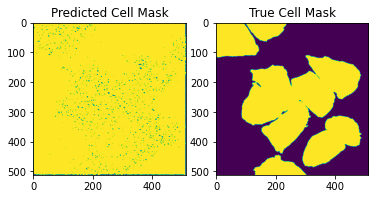

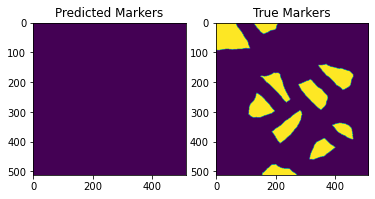

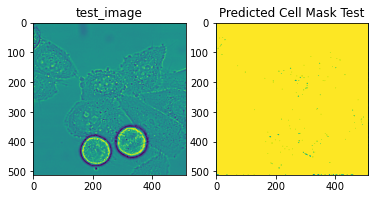

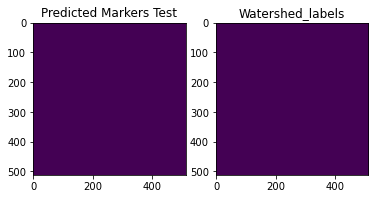

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 8, Batch: 10
Cell Mask Loss: 0.46, Markers Loss: 0.65


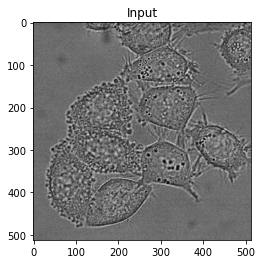

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.23, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


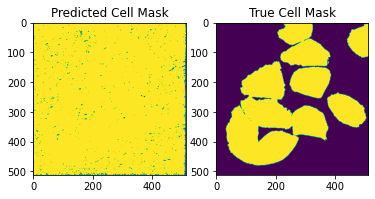

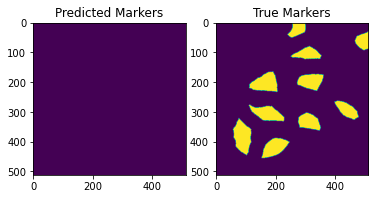

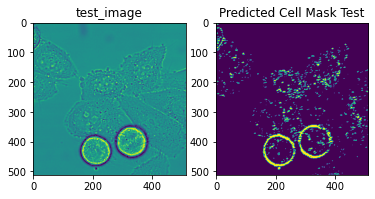

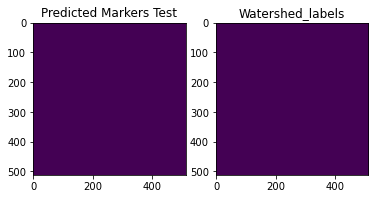

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 8, Batch: 20
Cell Mask Loss: 0.37, Markers Loss: 0.68


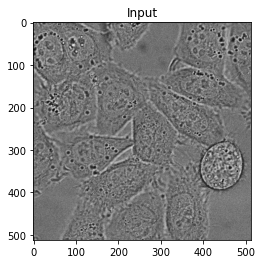

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.32, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


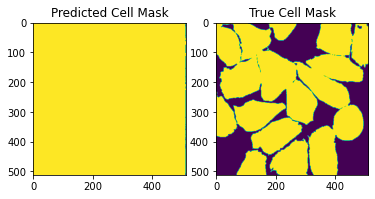

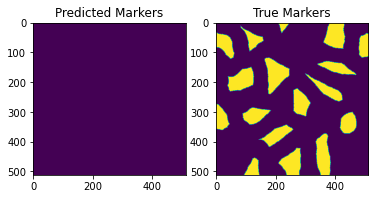

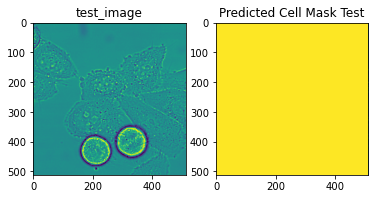

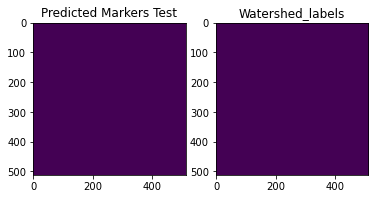

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 8, Batch: 30
Cell Mask Loss: 0.47, Markers Loss: 0.65


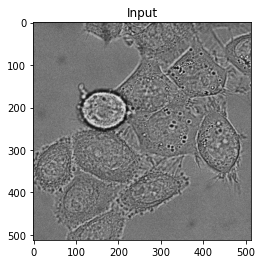

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.49, Test Markers Loss: 0.66


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


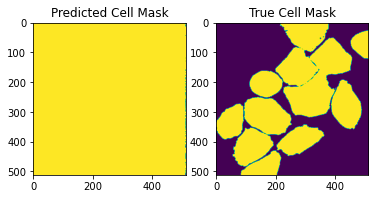

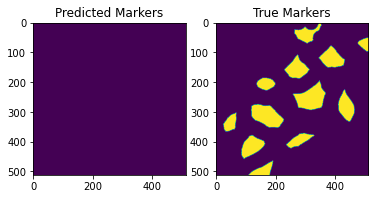

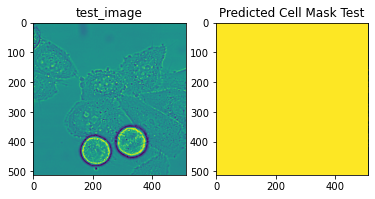

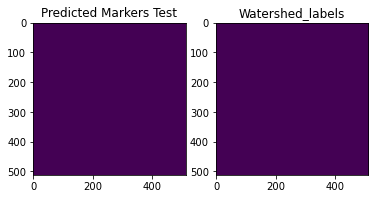

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 8, Batch: 40
Cell Mask Loss: 0.51, Markers Loss: 0.66


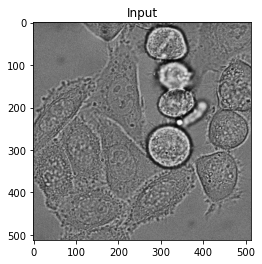

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.53, Test Markers Loss: 0.63


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


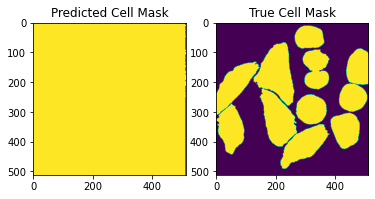

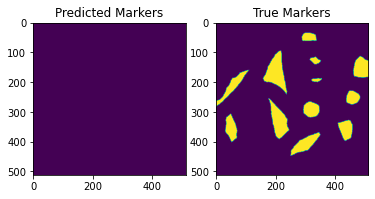

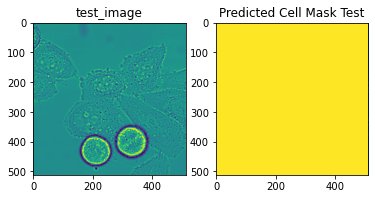

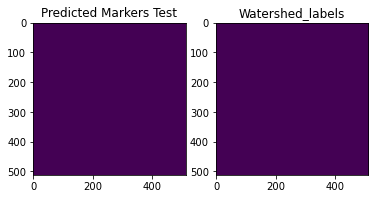

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 8, Batch: 50
Cell Mask Loss: 0.47, Markers Loss: 0.67


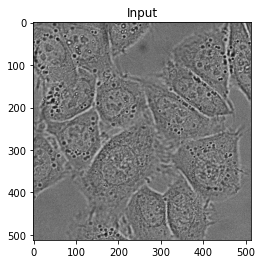

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.47, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


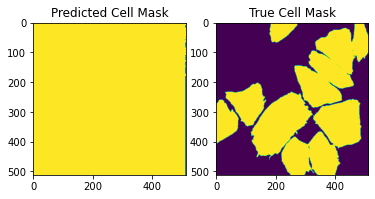

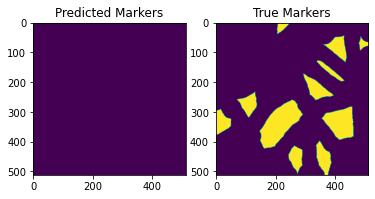

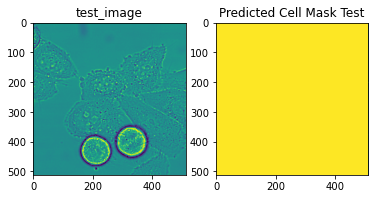

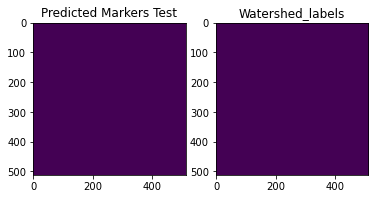

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 9, Batch: 1
Cell Mask Loss: 0.36, Markers Loss: 0.67


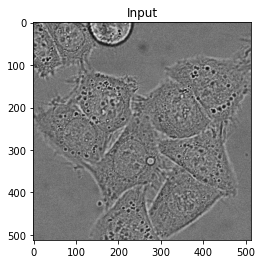

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.41, Test Markers Loss: 0.69


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


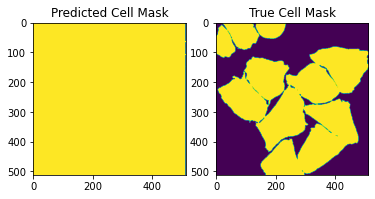

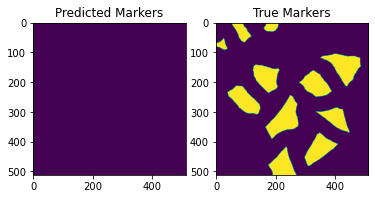

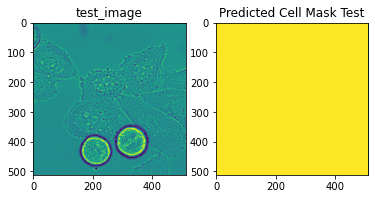

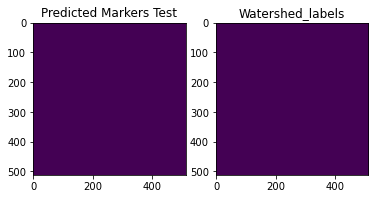

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 9, Batch: 10
Cell Mask Loss: 0.51, Markers Loss: 0.65


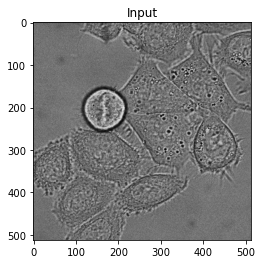

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.60, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


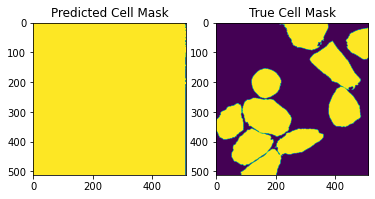

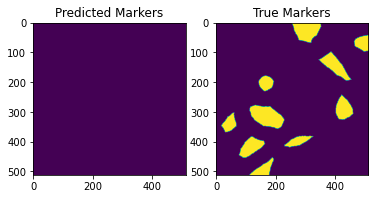

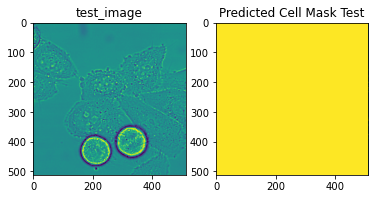

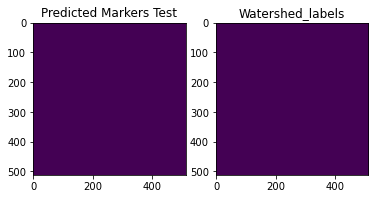

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 9, Batch: 20
Cell Mask Loss: 0.36, Markers Loss: 0.68


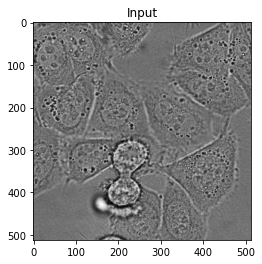

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.43, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


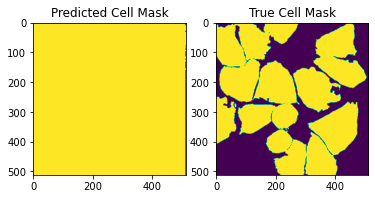

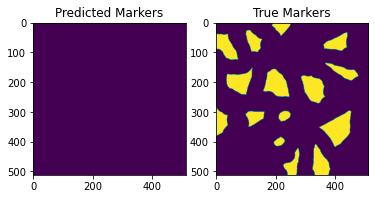

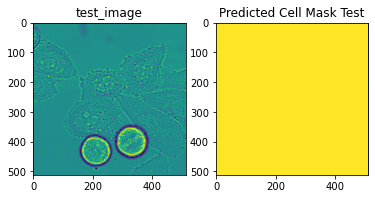

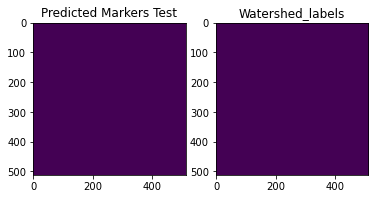

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 9, Batch: 30
Cell Mask Loss: 0.38, Markers Loss: 0.68


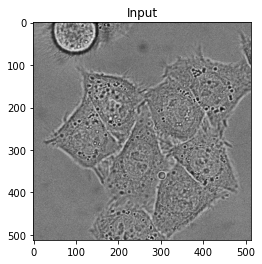

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.49, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


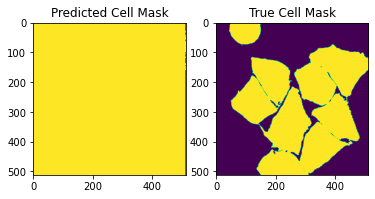

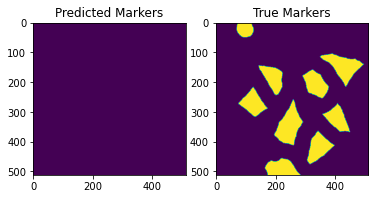

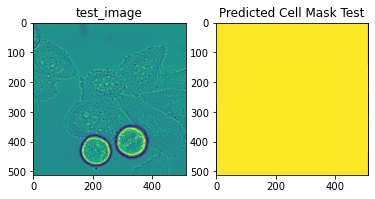

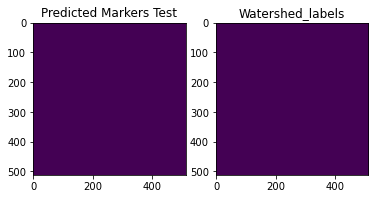

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 9, Batch: 40
Cell Mask Loss: 0.37, Markers Loss: 0.65


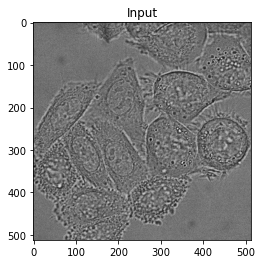

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.57, Test Markers Loss: 0.67


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


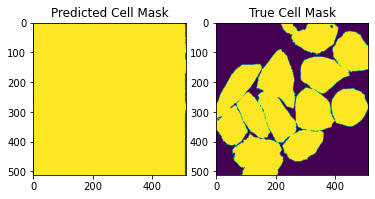

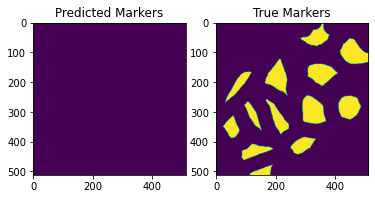

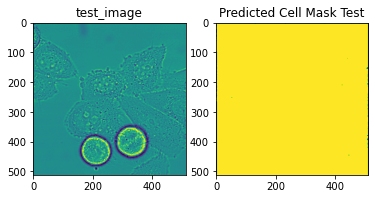

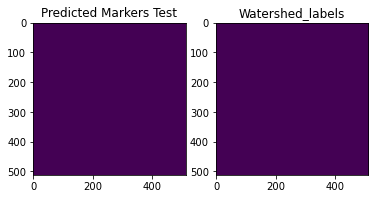

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 9, Batch: 50
Cell Mask Loss: 0.62, Markers Loss: 0.65


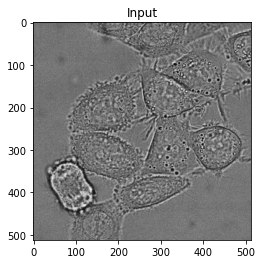

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.58, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


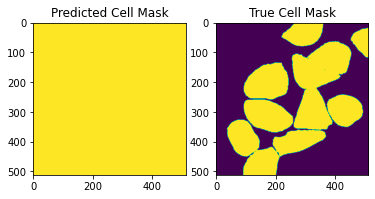

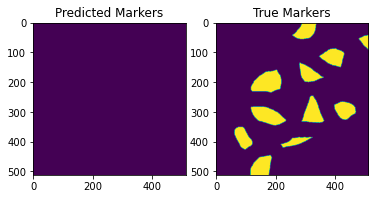

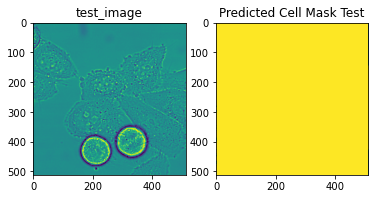

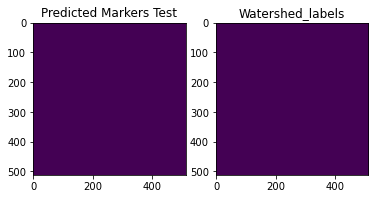

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 10, Batch: 1
Cell Mask Loss: 0.45, Markers Loss: 0.67


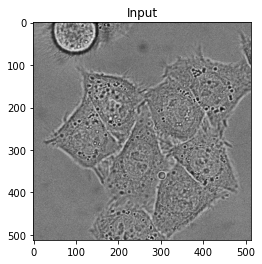

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.56, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


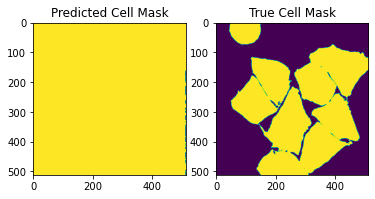

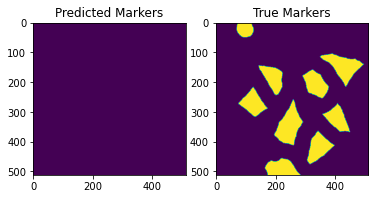

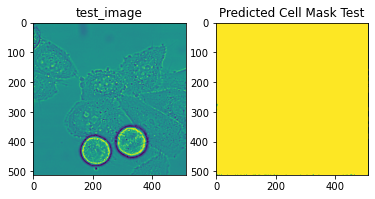

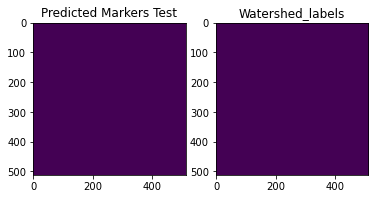

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 10, Batch: 10
Cell Mask Loss: 0.45, Markers Loss: 0.65


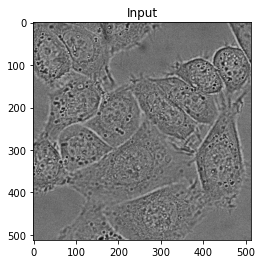

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.50, Test Markers Loss: 0.69


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


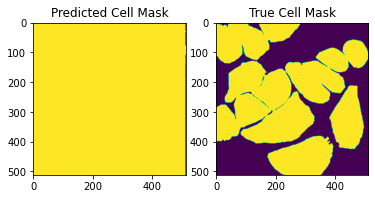

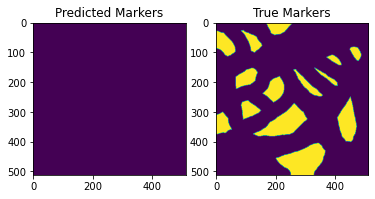

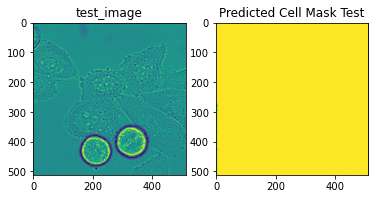

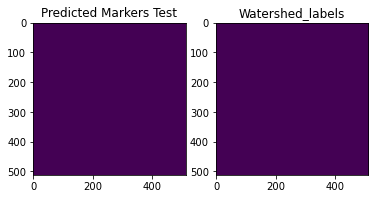

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 10, Batch: 20
Cell Mask Loss: 0.39, Markers Loss: 0.67


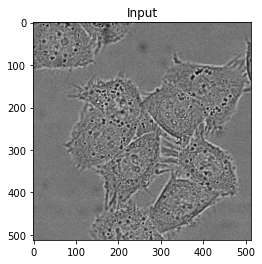

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.56, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


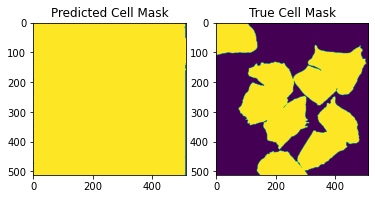

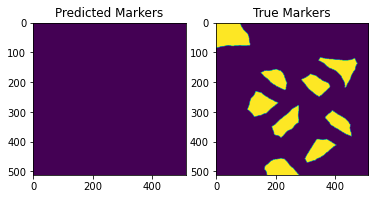

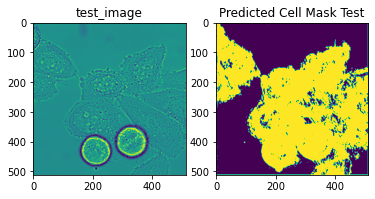

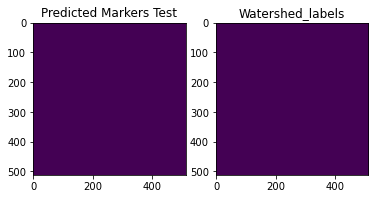

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 10, Batch: 30
Cell Mask Loss: 0.44, Markers Loss: 0.66


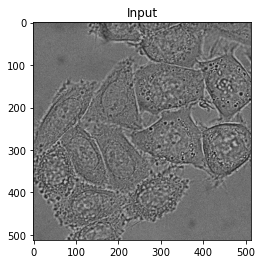

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 0.97, Test Markers Loss: 0.66


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


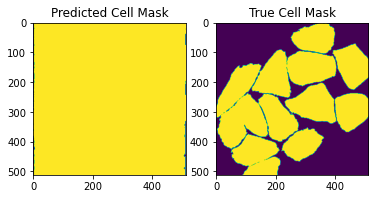

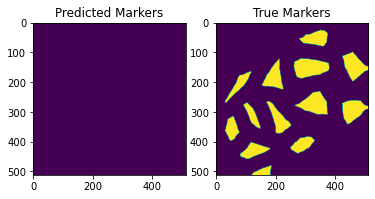

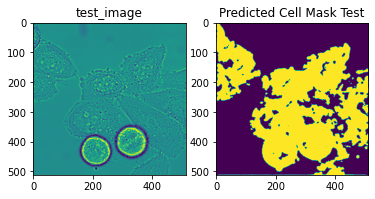

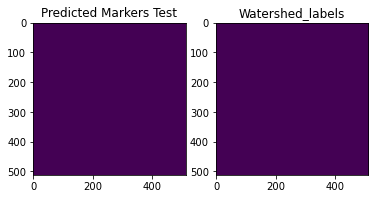

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 10, Batch: 40
Cell Mask Loss: 0.28, Markers Loss: 0.69


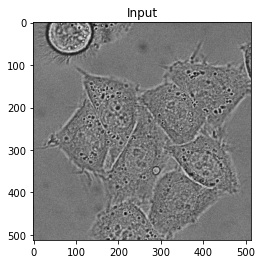

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 1.25, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


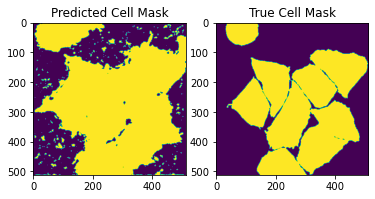

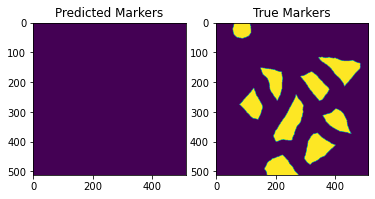

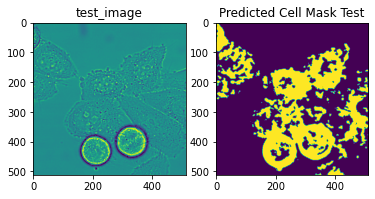

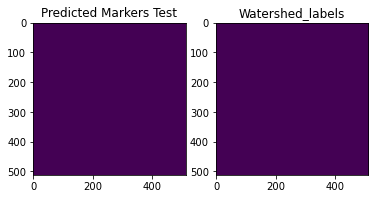

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


....................Epoch: 10, Batch: 50
Cell Mask Loss: 0.31, Markers Loss: 0.68


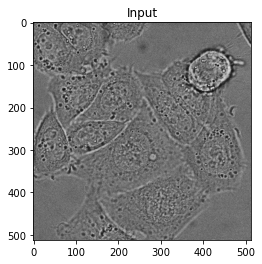

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 2.03, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


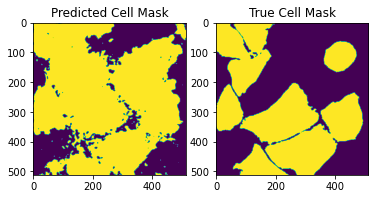

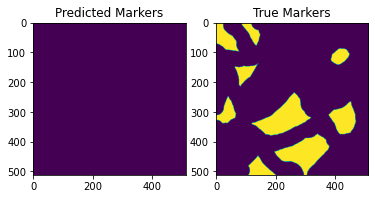

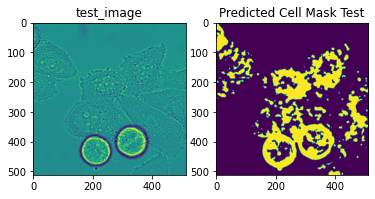

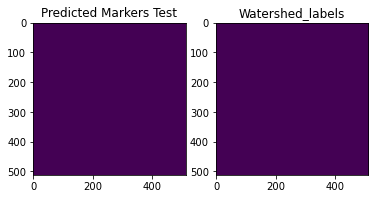

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..............Epoch: 11, Batch: 1
Cell Mask Loss: 0.26, Markers Loss: 0.67


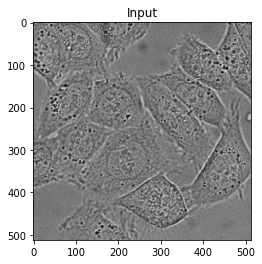

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 2.66, Test Markers Loss: 0.68


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


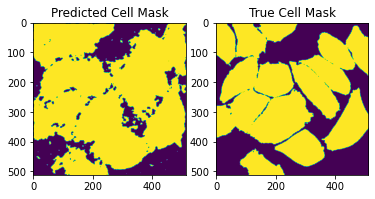

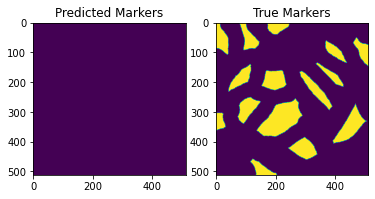

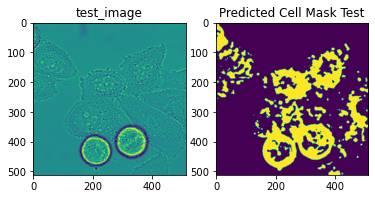

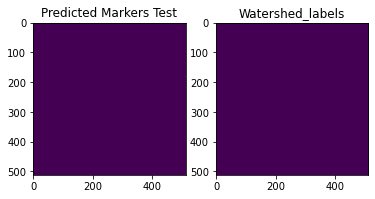

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................Epoch: 11, Batch: 10
Cell Mask Loss: 0.30, Markers Loss: 0.66


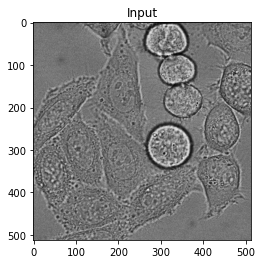

torch.Size([3, 1, 512, 512]) torch.Size([1, 1, 512, 512])
..Test Cell Mask Loss: 3.34, Test Markers Loss: 0.65


E:\Anaconda\envs\compvis\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,


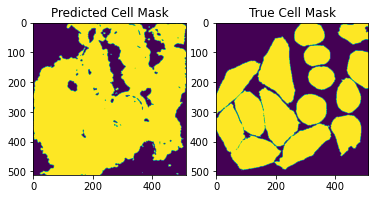

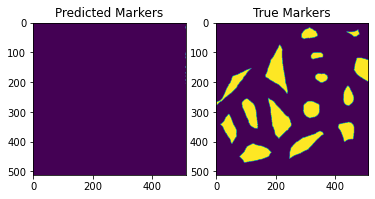

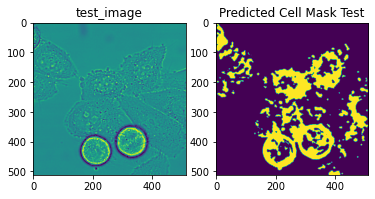

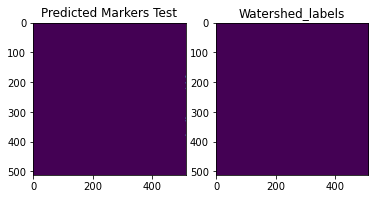

E:\Anaconda\envs\compvis\lib\site-packages\torch\nn\functional.py:2970: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


..................

In [ ]:
if __name__ == '__main__':
    main()